In [30]:
'''!pip install opendatasets --upgrade --quiet
import opendatasets as od

dataset_url = 'https://www.kaggle.com/datasets/balraj98/deepglobe-road-extraction-dataset'
od.download(dataset_url)'''

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username:

  rahulvelamala


Your Kaggle Key:

  ········


Dataset URL: https://www.kaggle.com/datasets/balraj98/deepglobe-road-extraction-dataset


100%|██████████| 3.79G/3.79G [00:18<00:00, 226MB/s] 


In [31]:
'''import os
import shutil

# Define paths
base_dir = '/kaggle/working/deepglobe-road-extraction-dataset/train'
output_dir = '/kaggle/working/train_data'
images_dir = os.path.join(output_dir, 'images')
masks_dir = os.path.join(output_dir, 'masks')

# Create output directories if they don't exist
os.makedirs(images_dir, exist_ok=True)
os.makedirs(masks_dir, exist_ok=True)

# List all files in the base directory
files = os.listdir(base_dir)

# Iterate through the files and separate images and masks
for file_name in files:
    file_path = os.path.join(base_dir, file_name)
    
    # Check if the file is a mask or an image based on its name
    if '_mask' in file_name:
        # Remove '_mask' from the filename
        new_mask_name = file_name.replace('_mask', '')
        # Move and rename mask to the masks folder
        shutil.copy(file_path, os.path.join(masks_dir, new_mask_name))
    elif '_sat' in file_name:
        # Remove '_sat' from the filename
        new_image_name = file_name.replace('_sat', '')
        # Move and rename image to the images folder
        shutil.copy(file_path, os.path.join(images_dir, new_image_name))

print("Files successfully separated and renamed.")'''


Files successfully separated and renamed.


In [19]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import shutil
import glob
from zipfile import ZipFile
import random

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, UpSampling2D, Concatenate, Conv2DTranspose, BatchNormalization, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from tensorflow.keras.utils import Sequence

import tensorflow as tf
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPooling2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
import keras_tuner as kt


from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, Dropout, MaxPooling2D, Conv2DTranspose, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger
import matplotlib.pyplot as plt
from tensorflow.keras import backend as K
from tensorflow.keras.utils import Sequence
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau


from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, Concatenate, BatchNormalization, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger



In [32]:
images = sorted(glob.glob('/kaggle/working/train_data/images/*.jpg'))
masks = sorted(glob.glob('/kaggle/working/train_data/masks/*.png'))
len(images),len(masks)

(6226, 6226)

In [33]:
'''image_filenames = os.listdir('/kaggle/working/train_data/images')
# Set the source directories
image_dir = '/kaggle/working/train_data/images'
mask_dir = '/kaggle/working/train_data/masks'

# Create destination directories
destination_dir = '/kaggle/working/val_data'
os.makedirs(os.path.join(destination_dir, 'images'), exist_ok=True)
os.makedirs(os.path.join(destination_dir, 'masks'), exist_ok=True)

# Randomly select 1000 image filenames
selected_filenames = random.sample(image_filenames, 1000)

# Function to move files to the new directory
def move_files(filenames, src_dir, dst_dir, mask=False):
    for filename in filenames:
        # If moving masks, modify filename to match mask naming pattern
        if mask:
            # Assuming masks have names like 'imagename_mask.png'
            filename = os.path.splitext(filename)[0] + '.png'  
            #Adjust _mask.png if your mask names are different

        src_path = os.path.join(src_dir, filename)
        dst_path = os.path.join(dst_dir, filename)

        #Check if file exists before moving
        if os.path.exists(src_path):
            shutil.move(src_path, dst_path)
        else:
            print(f"Warning: File not found: {src_path}") #Prints a warning if file doesn't exist

# Move selected images
move_files(selected_filenames, image_dir, os.path.join(destination_dir, 'images'))

# Move corresponding masks, setting mask=True to trigger filename modification
move_files(selected_filenames, mask_dir, os.path.join(destination_dir, 'masks'), mask=True)

print("Files moved successfully.")'''

Files moved successfully.


In [34]:
images = sorted(glob.glob('/kaggle/working/train_data/images/*.jpg'))
masks = sorted(glob.glob('/kaggle/working/train_data/masks/*.png'))
len(images),len(masks)

(5226, 5226)

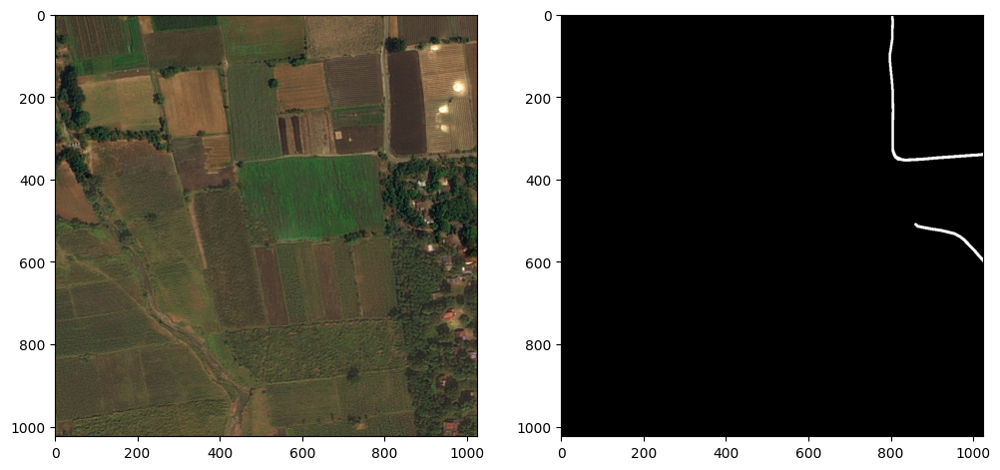

In [40]:
msk = cv2.imread('/kaggle/working/val_data/masks/186646.png')
img1 = cv2.imread('/kaggle/working/val_data/images/186646.jpg')

img = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
fig = plt.figure(figsize=(12,12))

plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(msk)

In [41]:
# Define paths (you need to set these paths accordingly)
base_dir = '/kaggle/working/road_segmentation_results'
model_dir = os.path.join(base_dir, 'models')
log_dir = os.path.join(base_dir, 'logs')
plot_dir = os.path.join(base_dir, 'plots')
prediction_dir = os.path.join(base_dir, 'predictions')

In [42]:
# Custom callback for visualizing validation predictions
class ValidationVisualization(tf.keras.callbacks.Callback):
    def __init__(self, val_generator, output_dir, num_images=10):
        self.val_generator = val_generator
        self.output_dir = output_dir
        self.num_images = num_images
        os.makedirs(self.output_dir, exist_ok=True)

    def on_epoch_end(self, epoch, logs=None):
        val_data = next(iter(self.val_generator))
        val_images, val_masks = val_data[0], val_data[1]
        predictions = self.model.predict(val_images)

        # Binarize the predictions
        binary_predictions = (predictions > 0.5).astype(np.uint8)

        # Adjust number of images to visualize if batch size is smaller
        num_images = min(self.num_images, val_images.shape[0])

        fig, axes = plt.subplots(num_images, 3, figsize=(12, 4 * num_images))
        for i in range(num_images):
            axes[i, 0].imshow(val_images[i])
            axes[i, 0].set_title("Input Image")
            axes[i, 1].imshow(val_masks[i].squeeze(), cmap='gray')
            axes[i, 1].set_title("True Mask")
            axes[i, 2].imshow(binary_predictions[i].squeeze(), cmap='gray')
            axes[i, 2].set_title("Predicted Mask")
        plt.savefig(os.path.join(self.output_dir, f'epoch_{epoch:02d}.png'))
        plt.show()
        plt.close()

In [44]:
# Ensure directories exist
for dir_path in [model_dir, log_dir, plot_dir, prediction_dir]:
    os.makedirs(dir_path, exist_ok=True)

# DataGenerator class with data augmentation
# DataGenerator class with enhanced data augmentation
class DataGenerator(Sequence):
    def __init__(self, image_paths, mask_paths, batch_size=2, image_size=(1024, 1024), shuffle=True, augment=False):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.augment = augment
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.image_paths) / self.batch_size))

    def __getitem__(self, index):
        indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]
        batch_image_paths = [self.image_paths[i] for i in indices]
        batch_mask_paths = [self.mask_paths[i] for i in indices]

        images, masks = self.__data_generation(batch_image_paths, batch_mask_paths)
        return images, masks

    def on_epoch_end(self):
        self.indices = np.arange(len(self.image_paths))
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __data_generation(self, batch_image_paths, batch_mask_paths):
        images = np.empty((self.batch_size, *self.image_size, 3), dtype=np.float32)
        masks = np.empty((self.batch_size, *self.image_size, 1), dtype=np.float32)

        for i, (image_path, mask_path) in enumerate(zip(batch_image_paths, batch_mask_paths)):
            image = tf.io.read_file(image_path)
            image = tf.image.decode_png(image, channels=3)
            image = tf.image.convert_image_dtype(image, tf.float32)
            image = tf.image.resize(image, self.image_size)

            mask = tf.io.read_file(mask_path)
            mask = tf.image.decode_png(mask, channels=1)
            mask = tf.image.convert_image_dtype(mask, tf.float32)
            mask = tf.image.resize(mask, self.image_size)

            if self.augment:
                image, mask = self.__augment(image, mask)

            # Ensure binary mask
            mask = tf.where(mask > 0.5, 1.0, 0.0)

            images[i] = image.numpy()
            masks[i] = mask.numpy()

        return images, masks

    def __augment(self, image, mask):
        # Flip left-right
        if tf.random.uniform(()) > 0.5:
            image = tf.image.flip_left_right(image)
            mask = tf.image.flip_left_right(mask)
        
        # Flip up-down
        if tf.random.uniform(()) > 0.5:
            image = tf.image.flip_up_down(image)
            mask = tf.image.flip_up_down(mask)
        
        # Random brightness (only for image)
        if tf.random.uniform(()) > 0.5:
            image = tf.image.random_brightness(image, max_delta=0.1)
        
        # Random contrast (only for image)
        if tf.random.uniform(()) > 0.5:
            image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
        
        # Random saturation (only for image)
        if tf.random.uniform(()) > 0.5:
            image = tf.image.random_saturation(image, lower=0.9, upper=1.1)
        
        # Random hue (only for image)
        if tf.random.uniform(()) > 0.5:
            image = tf.image.random_hue(image, max_delta=0.1)
        
        # Ensure the image values are still in [0, 1]
        image = tf.clip_by_value(image, 0, 1)
        
        return image, mask


# Define the paths
train_image_dir = '/kaggle/working/train_data/images'
train_mask_dir = '/kaggle/working/train_data/masks'
val_image_dir = '/kaggle/working/val_data/images'
val_mask_dir = '/kaggle/working/val_data/masks'

# Function to get the paths of images and masks
import os

def get_image_mask_paths(image_dir, mask_dir):
    image_paths = []
    mask_paths = []
    
    # Create a dictionary to match mask files with images based on the filename (without extension)
    mask_files = {os.path.splitext(file)[0]: file for file in os.listdir(mask_dir) if file.endswith('.png')}
    
    for root, _, files in os.walk(image_dir):
        for file in files:
            if file.endswith('.jpg'):
                # Get the base name (without extension) of the image file
                base_name = os.path.splitext(file)[0]
                
                # Check if a corresponding mask with the same base name exists
                if base_name in mask_files:
                    image_paths.append(os.path.join(root, file))
                    mask_paths.append(os.path.join(mask_dir, mask_files[base_name]))
    
    return image_paths, mask_paths


# Get the training and validation paths
train_image_paths, train_mask_paths = get_image_mask_paths(train_image_dir, train_mask_dir)
val_image_paths, val_mask_paths = get_image_mask_paths(val_image_dir, val_mask_dir)

# Create the DataGenerator instances
train_generator = DataGenerator(train_image_paths, train_mask_paths, batch_size=2, image_size=(1024, 1024), shuffle=True, augment=True)
val_generator = DataGenerator(val_image_paths, val_mask_paths, batch_size=2, image_size=(1024, 1024), shuffle=False, augment=False)


In [46]:
# Custom metrics with division-by-zero checks
def precision(y_true, y_pred):
    true_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_true * y_pred, 0, 1)))
    predicted_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + tf.keras.backend.epsilon())
    return precision

def recall(y_true, y_pred):
    true_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_true * y_pred, 0, 1)))
    possible_positives = tf.reduce_sum(tf.round(tf.clip_by_value(y_true, 0, 1)))
    recall = true_positives / (possible_positives + tf.keras.backend.epsilon())
    return recall

def f1_score(y_true, y_pred):
    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    return 2 * (p * r) / (p + r + tf.keras.backend.epsilon())

def iou(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    intersection = tf.reduce_sum(tf.abs(y_true * y_pred))
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    iou = intersection / (union + tf.keras.backend.epsilon())
    return iou

def jacard_coef(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)

def jacard_coef_loss(y_true, y_pred):
    return -jacard_coef(y_true, y_pred)

def combined_loss(y_true, y_pred):
    return  jacard_coef_loss(y_true, y_pred)

# Dice Loss implementation
def dice_loss(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    return 1 - (numerator + tf.keras.backend.epsilon()) / (denominator + tf.keras.backend.epsilon())

In [53]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, UpSampling2D, concatenate, DepthwiseConv2D

def depthwise_conv_block(x, filters, kernel_size=(3, 3), padding='same', dilation_rate=1):
    """A block with depthwise separable convolution followed by pointwise convolution."""
    x = DepthwiseConv2D(kernel_size, padding=padding, dilation_rate=dilation_rate)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(filters, (1, 1), padding='same')(x)
    x = BatchNormalization()(x)
    return Activation('relu')(x)

def get_optimized_unet_1024(input_shape=(1024, 1024, 3), num_classes=1):
    inputs = Input(shape=input_shape)

    # Encoder
    down0b = depthwise_conv_block(inputs, 8)
    down0b = depthwise_conv_block(down0b, 8)
    down0b_pool = MaxPooling2D((2, 2), strides=(2, 2))(down0b)

    down0a = depthwise_conv_block(down0b_pool, 16)
    down0a = depthwise_conv_block(down0a, 16)
    down0a_pool = MaxPooling2D((2, 2), strides=(2, 2))(down0a)

    down0 = depthwise_conv_block(down0a_pool, 32)
    down0 = depthwise_conv_block(down0, 32)
    down0_pool = MaxPooling2D((2, 2), strides=(2, 2))(down0)

    down1 = depthwise_conv_block(down0_pool, 64)
    down1 = depthwise_conv_block(down1, 64)
    down1_pool = MaxPooling2D((2, 2), strides=(2, 2))(down1)

    down2 = depthwise_conv_block(down1_pool, 128)
    down2 = depthwise_conv_block(down2, 128)
    down2_pool = MaxPooling2D((2, 2), strides=(2, 2))(down2)

    down3 = depthwise_conv_block(down2_pool, 256)
    down3 = depthwise_conv_block(down3, 256)
    down3_pool = MaxPooling2D((2, 2), strides=(2, 2))(down3)

    down4 = depthwise_conv_block(down3_pool, 512)
    down4 = depthwise_conv_block(down4, 512)
    down4_pool = MaxPooling2D((2, 2), strides=(2, 2))(down4)

    # Bottleneck with dilation for larger receptive field
    center = depthwise_conv_block(down4_pool, 1024, dilation_rate=2)
    center = depthwise_conv_block(center, 1024, dilation_rate=2)

    # Decoder
    up4 = UpSampling2D((2, 2))(center)
    up4 = concatenate([down4, up4], axis=3)
    up4 = depthwise_conv_block(up4, 512)

    up3 = UpSampling2D((2, 2))(up4)
    up3 = concatenate([down3, up3], axis=3)
    up3 = depthwise_conv_block(up3, 256)

    up2 = UpSampling2D((2, 2))(up3)
    up2 = concatenate([down2, up2], axis=3)
    up2 = depthwise_conv_block(up2, 128)

    up1 = UpSampling2D((2, 2))(up2)
    up1 = concatenate([down1, up1], axis=3)
    up1 = depthwise_conv_block(up1, 64)

    up0 = UpSampling2D((2, 2))(up1)
    up0 = concatenate([down0, up0], axis=3)
    up0 = depthwise_conv_block(up0, 32)

    up0a = UpSampling2D((2, 2))(up0)
    up0a = concatenate([down0a, up0a], axis=3)
    up0a = depthwise_conv_block(up0a, 16)

    up0b = UpSampling2D((2, 2))(up0a)
    up0b = concatenate([down0b, up0b], axis=3)
    up0b = depthwise_conv_block(up0b, 8)

    # Output layer
    classify = Conv2D(num_classes, (1, 1), activation='sigmoid')(up0b)

    # Create model
    model = Model(inputs=inputs, outputs=classify)

    return model


In [54]:
model = get_unet_1024(input_shape=(1024, 1024, 3), num_classes=1)
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 1024,      │          0 │ -                 │
│ (InputLayer)        │ 1024, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_48 (Conv2D)  │ (None, 1024,      │        224 │ input_layer_2[0]… │
│                     │ 1024, 8)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1024,      │         32 │ conv2d_48[0][0]   │
│ (BatchNormalizatio… │ 1024, 8)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_46       │ (None, 1024,      │          0 │ batch_normalizat… │
│ (Activation)        │ 1024, 8)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_49 (Conv2D)  │ (None, 1024,      │        584 │ activation_46[0]… │
│                     │ 1024, 8)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1024,      │         32 │ conv2d_49[0][0]   │
│ (BatchNormalizatio… │ 1024, 8)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_47       │ (None, 1024,      │          0 │ batch_normalizat… │
│ (Activation)        │ 1024, 8)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_14    │ (None, 512, 512,  │          0 │ activation_47[0]… │
│ (MaxPooling2D)      │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_50 (Conv2D)  │ (None, 512, 512,  │      1,168 │ max_pooling2d_14… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │         64 │ conv2d_50[0][0]   │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_48       │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_51 (Conv2D)  │ (None, 512, 512,  │      2,320 │ activation_48[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │         64 │ conv2d_51[0][0]   │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_49       │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_15    │ (None, 256, 256,  │          0 │ activation_49[0]… │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_52 (Conv2D)  │ (None, 256, 256,  │      4,640 │ max_pooling2d_15… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_52[0][0] 

 Total params: 28,336,105 (108.09 MB)

 Trainable params: 28,325,913 (108.05 MB)

 Non-trainable params: 10,192 (39.81 KB)

In [55]:
# Compile the model with a lower initial learning rate
weight_decay = 1e-4
initial_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=initial_learning_rate,weight_decay=weight_decay),
              loss=dice_loss,
              metrics=[precision, recall, f1_score, iou])

# Define callbacks
best_model_checkpoint = ModelCheckpoint(os.path.join(model_dir, 'model_best.keras'), 
                                        save_best_only=True, 
                                        monitor='val_loss', 
                                        mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)
csv_logger = CSVLogger(os.path.join(log_dir, 'training_log.csv'))

# Custom callback for visualizing validation predictions
class ValidationVisualization(tf.keras.callbacks.Callback):
    def __init__(self, val_generator, output_dir, num_images=10):
        self.val_generator = val_generator
        self.output_dir = output_dir
        self.num_images = num_images
        os.makedirs(self.output_dir, exist_ok=True)

    def on_epoch_end(self, epoch, logs=None):
        val_data = next(iter(self.val_generator))
        val_images, val_masks = val_data[0], val_data[1]
        predictions = self.model.predict(val_images)

        # Binarize the predictions
        binary_predictions = (predictions > 0.5).astype(np.uint8)

        # Adjust number of images to visualize if batch size is smaller
        num_images = min(self.num_images, val_images.shape[0])

        fig, axes = plt.subplots(num_images, 3, figsize=(12, 4 * num_images))
        for i in range(num_images):
            axes[i, 0].imshow(val_images[i])
            axes[i, 0].set_title("Input Image")
            axes[i, 1].imshow(val_masks[i].squeeze(), cmap='gray')
            axes[i, 1].set_title("True Mask")
            axes[i, 2].imshow(binary_predictions[i].squeeze(), cmap='gray')
            axes[i, 2].set_title("Predicted Mask")
        plt.savefig(os.path.join(self.output_dir, f'epoch_{epoch:02d}.png'))
        plt.show()  # Add this line to plot the images
        plt.close()


Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
2024-10-17 17:06:05.714692: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4194304: 1.39408, expected 1.13094
2024-10-17 17:06:05.720042: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5242880: 3.45413, expected 2.90345
2024-10-17 17:06:05.720092: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5242910: 4.3501, expected 3.79942
2024-10-17 17:06:05.720102: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5242964: 4.38259, expected 3.83191
2024-10-17 17:06:05.720112: E external/local_xla/xla/service/gpu/

   1/2613 ━━━━━━━━━━━━━━━━━━━━ 33:18:08 46s/step - f1_score: 0.0827 - iou: 0.0403 - loss: 0.9224 - precision: 0.0443 - recall: 0.6145

I0000 00:00:1729184793.851545     859 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step56ms/step - f1_score: 0.1823 - iou: 0.0754 - loss: 0.8632 - precision: 0.1106 - recall: 0.792


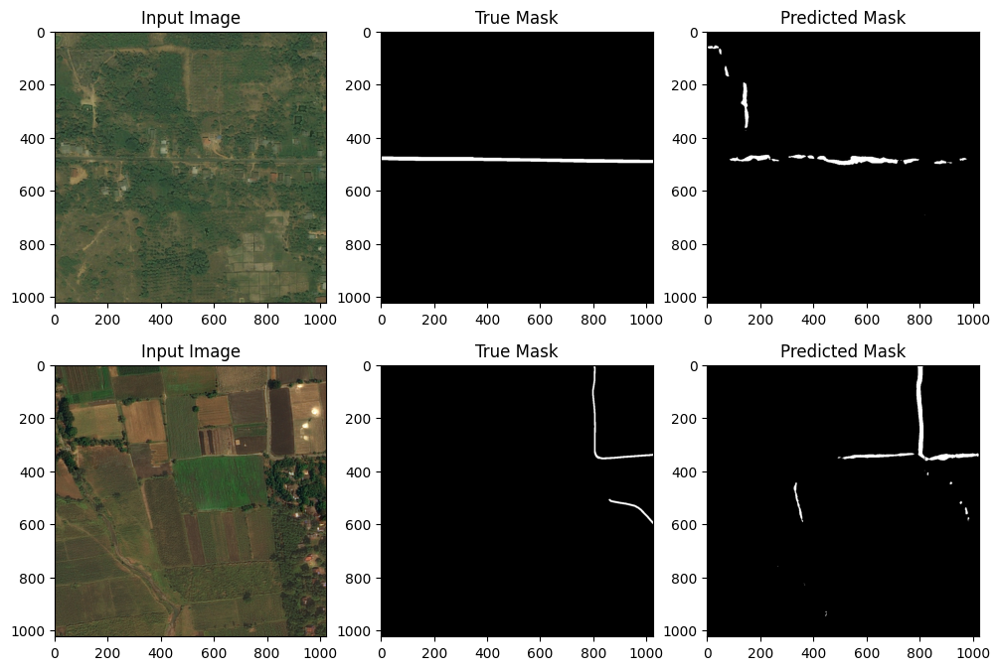

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 508s 177ms/step - f1_score: 0.1823 - iou: 0.0754 - loss: 0.8632 - precision: 0.1107 - recall: 0.7924 - val_f1_score: 0.4293 - val_iou: 0.1432 - val_loss: 0.7547 - val_precision: 0.3163 - val_recall: 0.7541 - learning_rate: 1.0000e-04
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/stepms/step - f1_score: 0.4255 - iou: 0.1771 - loss: 0.7083 - precision: 0.3314 - recall: 0.746


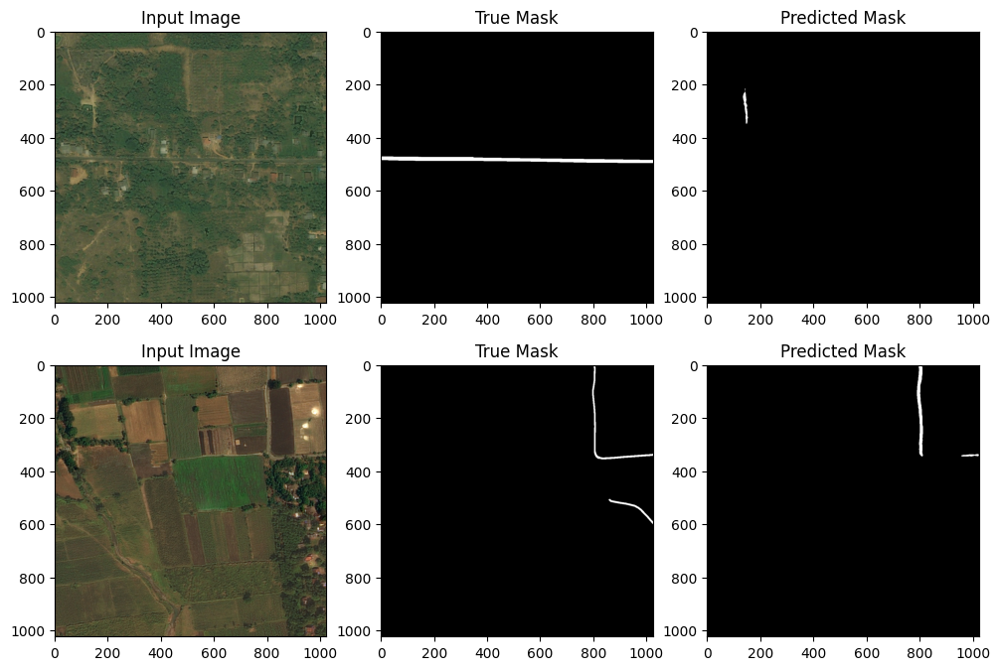

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 461s 176ms/step - f1_score: 0.4255 - iou: 0.1771 - loss: 0.7082 - precision: 0.3314 - recall: 0.7464 - val_f1_score: 0.5139 - val_iou: 0.2755 - val_loss: 0.5772 - val_precision: 0.4679 - val_recall: 0.6528 - learning_rate: 1.0000e-04
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/stepms/step - f1_score: 0.5537 - iou: 0.3271 - loss: 0.5151 - precision: 0.5211 - recall: 0.649


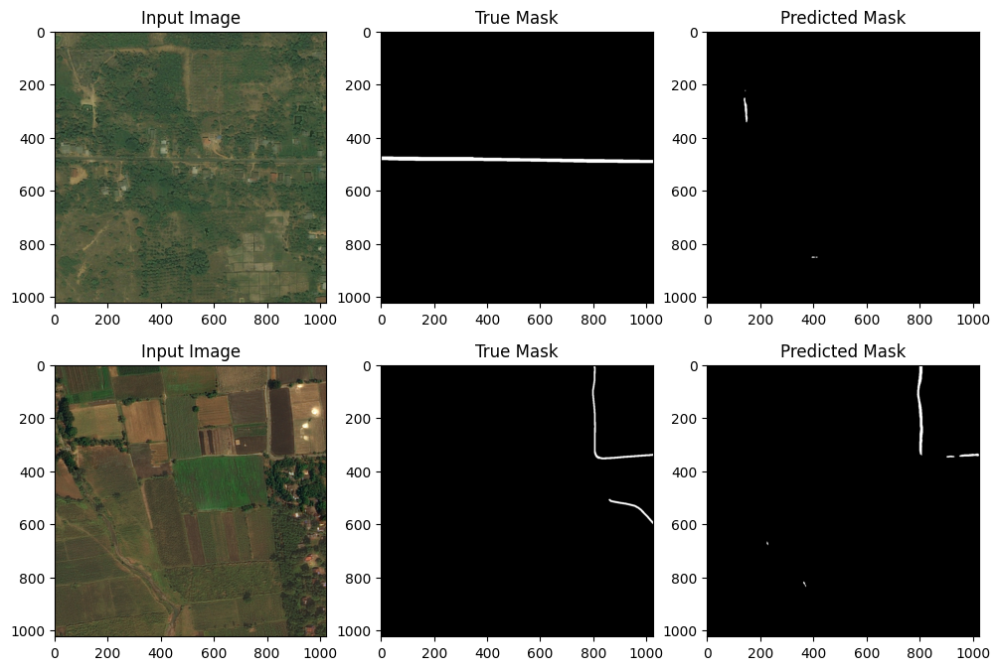

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 465s 178ms/step - f1_score: 0.5537 - iou: 0.3271 - loss: 0.5151 - precision: 0.5212 - recall: 0.6495 - val_f1_score: 0.5678 - val_iou: 0.3879 - val_loss: 0.4514 - val_precision: 0.5902 - val_recall: 0.5934 - learning_rate: 1.0000e-04
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/stepms/step - f1_score: 0.6005 - iou: 0.4194 - loss: 0.4158 - precision: 0.6015 - recall: 0.638


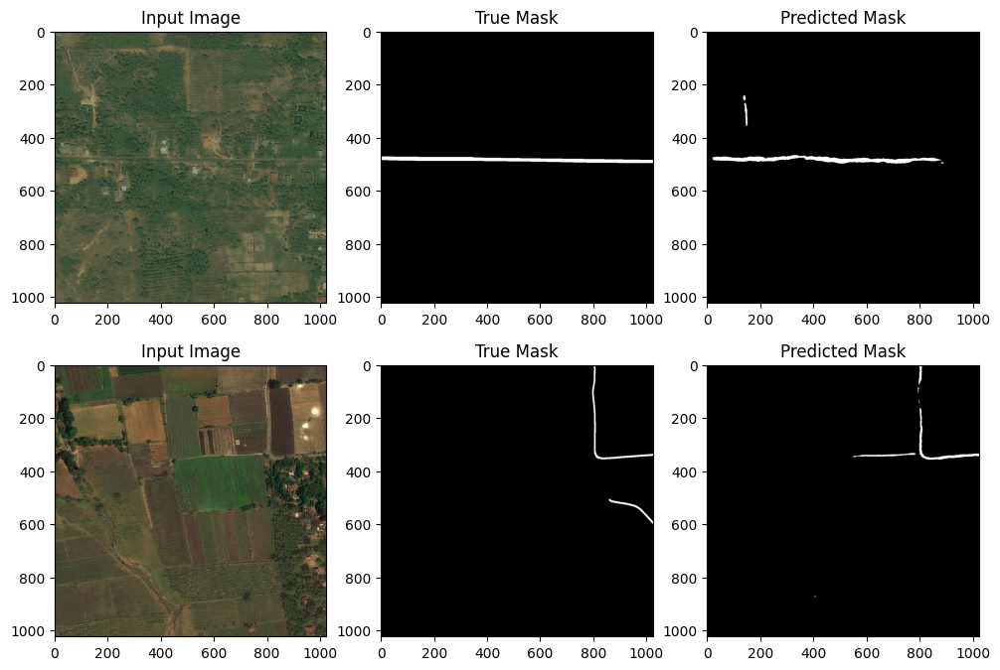

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 455s 174ms/step - f1_score: 0.6005 - iou: 0.4194 - loss: 0.4158 - precision: 0.6015 - recall: 0.6382 - val_f1_score: 0.5673 - val_iou: 0.4035 - val_loss: 0.4373 - val_precision: 0.7226 - val_recall: 0.4940 - learning_rate: 1.0000e-04
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/stepms/step - f1_score: 0.6173 - iou: 0.4495 - loss: 0.3869 - precision: 0.6245 - recall: 0.642


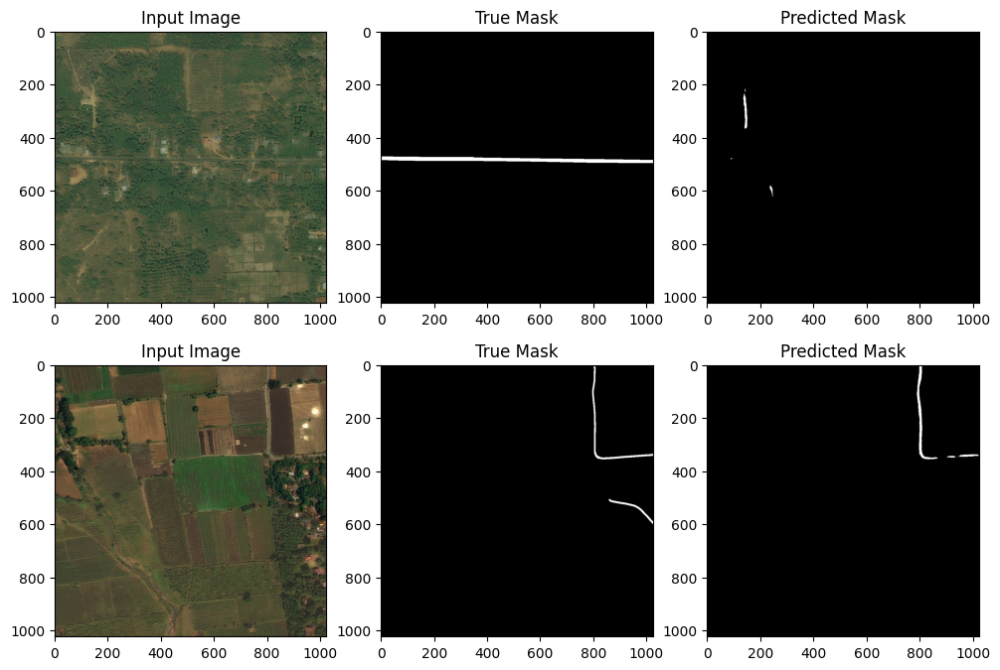

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 465s 178ms/step - f1_score: 0.6173 - iou: 0.4495 - loss: 0.3868 - precision: 0.6245 - recall: 0.6425 - val_f1_score: 0.6072 - val_iou: 0.4457 - val_loss: 0.3944 - val_precision: 0.7038 - val_recall: 0.5605 - learning_rate: 1.0000e-04
Epoch 6/20
1905/2613 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - f1_score: 0.6351 - iou: 0.4708 - loss: 0.3669 - precision: 0.6413 - recall: 0.6589

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/stepms/step - f1_score: 0.6354 - iou: 0.4712 - loss: 0.3665 - precision: 0.6418 - recall: 0.658


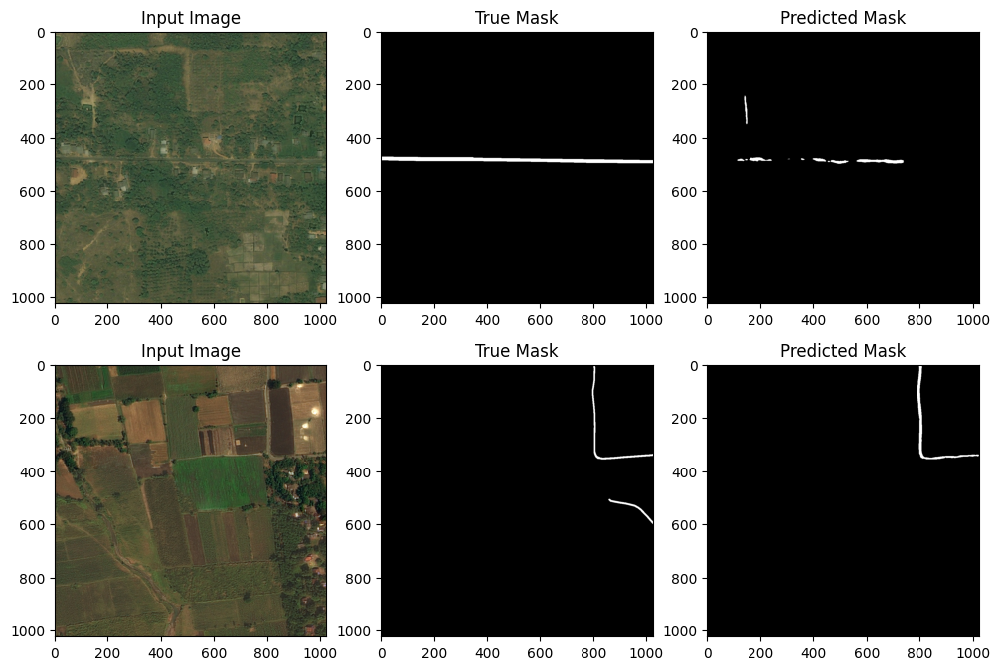

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 476s 182ms/step - f1_score: 0.6354 - iou: 0.4712 - loss: 0.3665 - precision: 0.6418 - recall: 0.6588 - val_f1_score: 0.6320 - val_iou: 0.4719 - val_loss: 0.3690 - val_precision: 0.7231 - val_recall: 0.5867 - learning_rate: 1.0000e-04
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/stepms/step - f1_score: 0.6487 - iou: 0.4865 - loss: 0.3526 - precision: 0.6544 - recall: 0.671


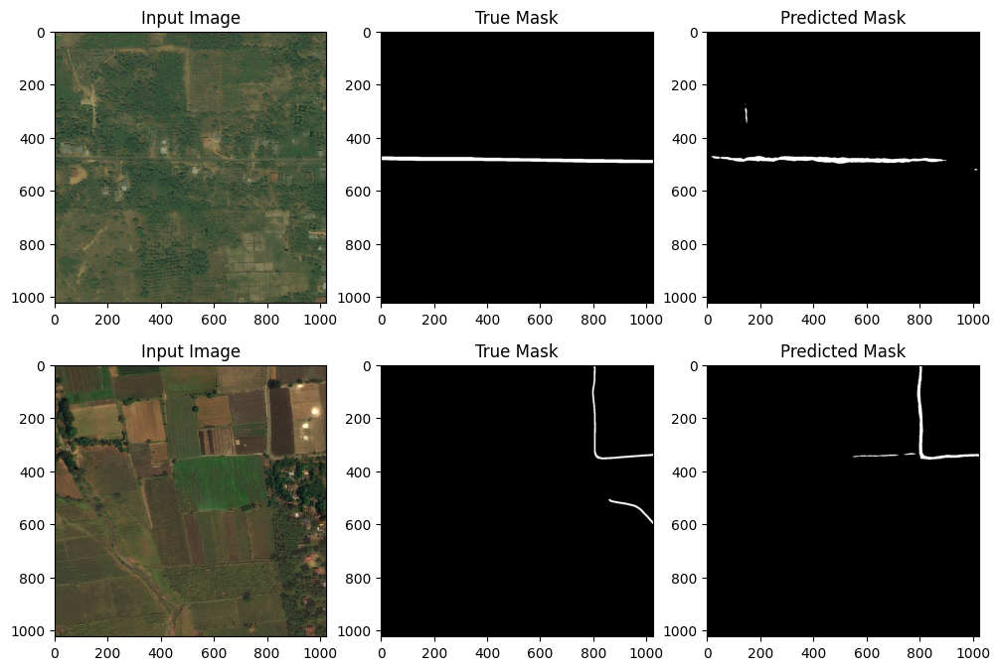

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 470s 179ms/step - f1_score: 0.6487 - iou: 0.4865 - loss: 0.3526 - precision: 0.6544 - recall: 0.6710 - val_f1_score: 0.6495 - val_iou: 0.4893 - val_loss: 0.3513 - val_precision: 0.6547 - val_recall: 0.6728 - learning_rate: 1.0000e-04
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/stepms/step - f1_score: 0.6571 - iou: 0.4954 - loss: 0.3440 - precision: 0.6642 - recall: 0.675


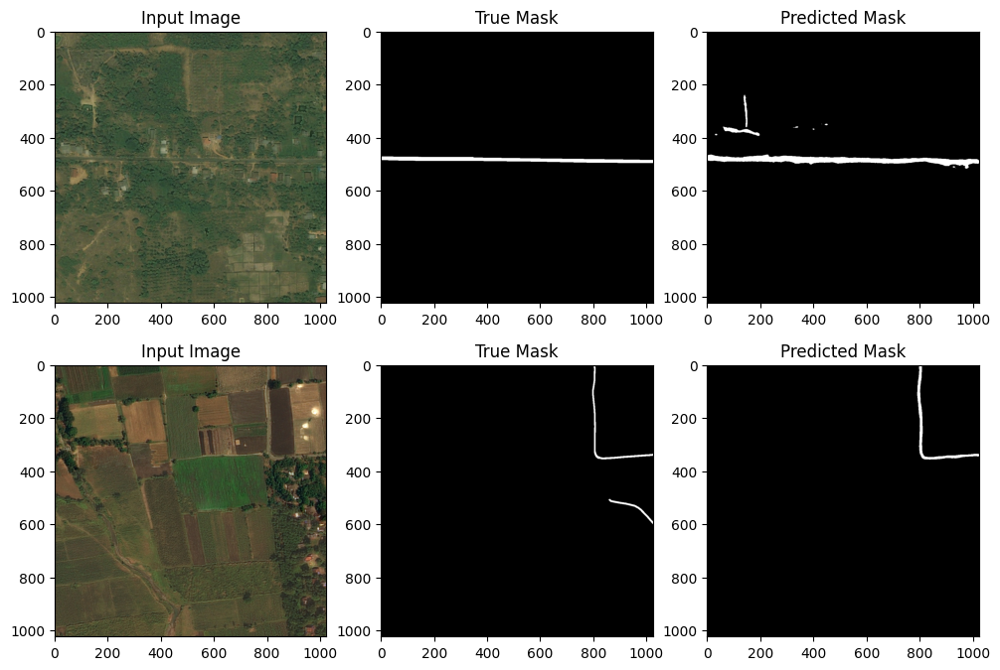

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 458s 175ms/step - f1_score: 0.6571 - iou: 0.4954 - loss: 0.3440 - precision: 0.6642 - recall: 0.6755 - val_f1_score: 0.6416 - val_iou: 0.4820 - val_loss: 0.3592 - val_precision: 0.6721 - val_recall: 0.6425 - learning_rate: 1.0000e-04
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/stepms/step - f1_score: 0.6630 - iou: 0.5024 - loss: 0.3379 - precision: 0.6695 - recall: 0.682


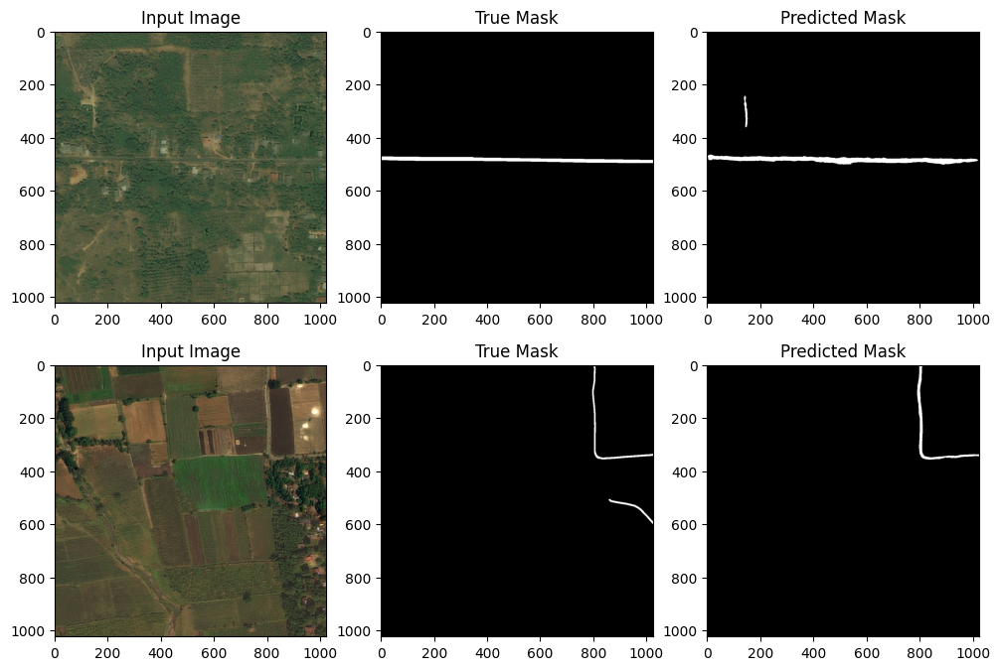

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 458s 175ms/step - f1_score: 0.6630 - iou: 0.5024 - loss: 0.3379 - precision: 0.6695 - recall: 0.6828 - val_f1_score: 0.6458 - val_iou: 0.4865 - val_loss: 0.3549 - val_precision: 0.6432 - val_recall: 0.6768 - learning_rate: 1.0000e-04
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/stepms/step - f1_score: 0.6724 - iou: 0.5130 - loss: 0.3284 - precision: 0.6783 - recall: 0.690


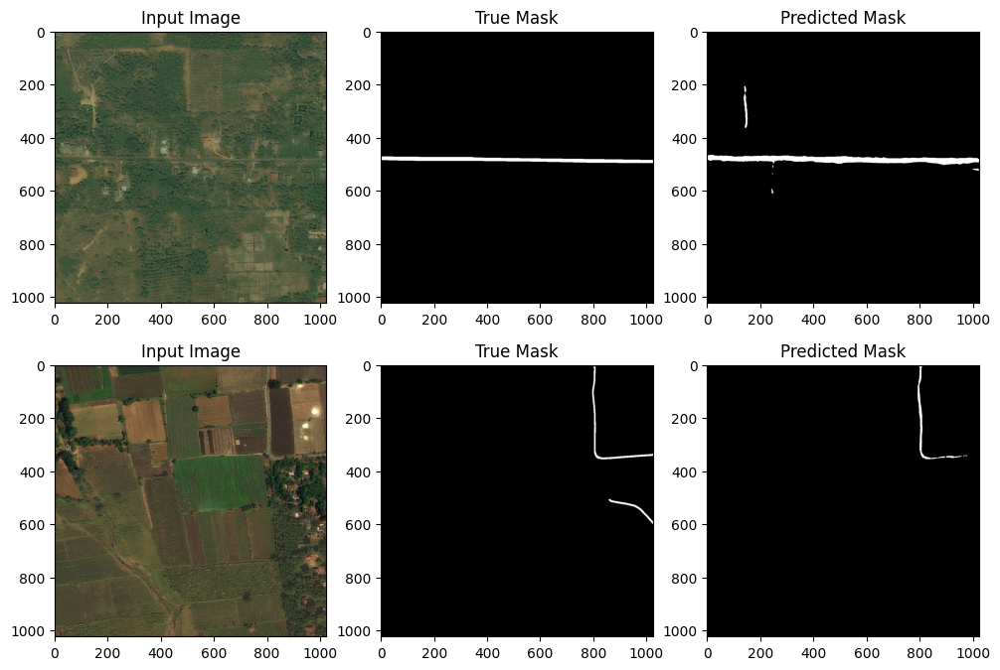

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 471s 180ms/step - f1_score: 0.6724 - iou: 0.5130 - loss: 0.3284 - precision: 0.6783 - recall: 0.6904 - val_f1_score: 0.6567 - val_iou: 0.4986 - val_loss: 0.3438 - val_precision: 0.6827 - val_recall: 0.6614 - learning_rate: 1.0000e-04
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/stepms/step - f1_score: 0.6752 - iou: 0.5162 - loss: 0.3255 - precision: 0.6792 - recall: 0.694


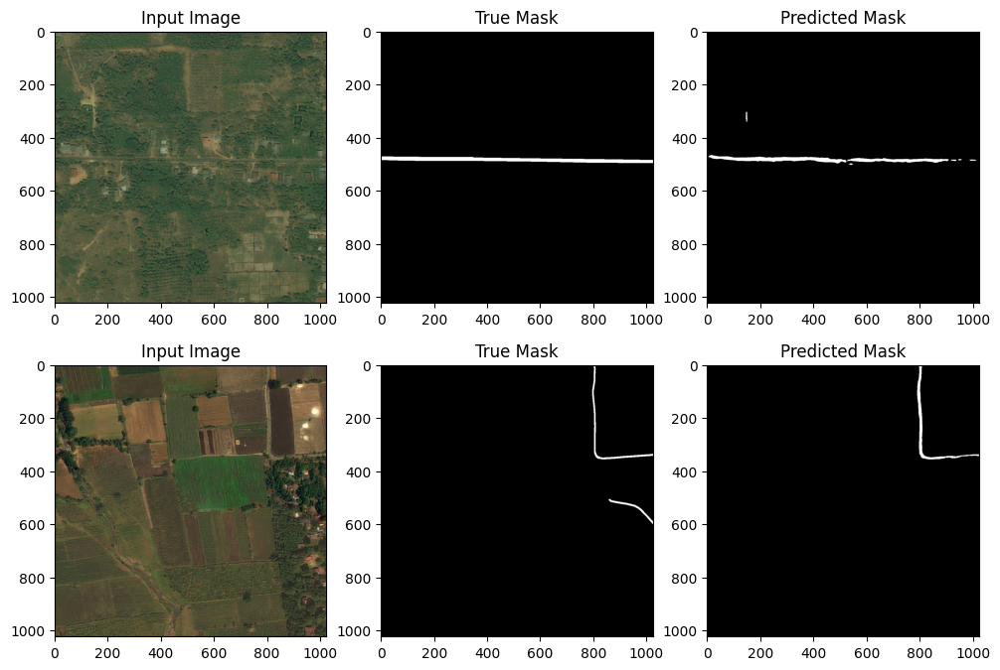

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 460s 176ms/step - f1_score: 0.6752 - iou: 0.5162 - loss: 0.3255 - precision: 0.6792 - recall: 0.6949 - val_f1_score: 0.6519 - val_iou: 0.4944 - val_loss: 0.3486 - val_precision: 0.7064 - val_recall: 0.6342 - learning_rate: 1.0000e-04
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/stepms/step - f1_score: 0.6802 - iou: 0.5215 - loss: 0.3204 - precision: 0.6836 - recall: 0.698


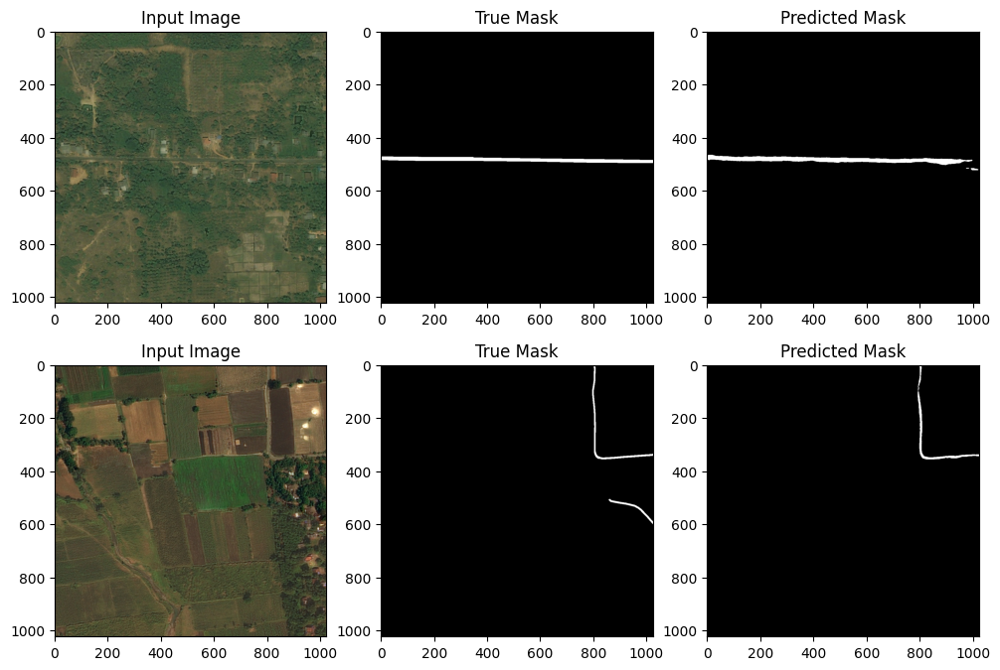

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 465s 178ms/step - f1_score: 0.6802 - iou: 0.5215 - loss: 0.3204 - precision: 0.6836 - recall: 0.6986 - val_f1_score: 0.6507 - val_iou: 0.4940 - val_loss: 0.3497 - val_precision: 0.7485 - val_recall: 0.6032 - learning_rate: 1.0000e-04
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/stepms/step - f1_score: 0.6844 - iou: 0.5269 - loss: 0.3161 - precision: 0.6900 - recall: 0.700


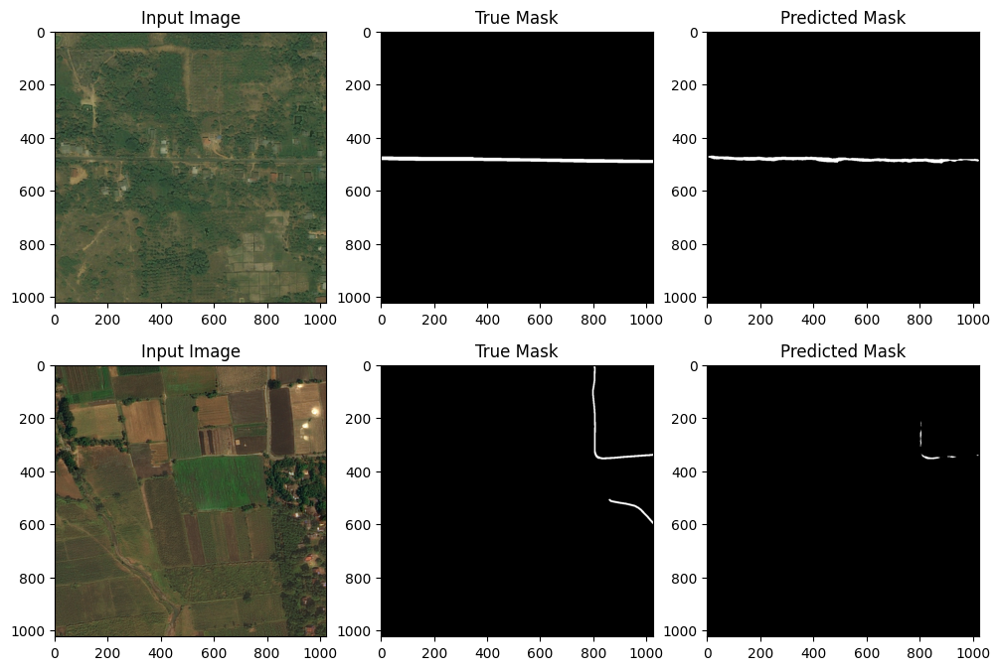

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 470s 180ms/step - f1_score: 0.6844 - iou: 0.5269 - loss: 0.3161 - precision: 0.6900 - recall: 0.7009 - val_f1_score: 0.6500 - val_iou: 0.4939 - val_loss: 0.3504 - val_precision: 0.7285 - val_recall: 0.6178 - learning_rate: 1.0000e-04
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/stepms/step - f1_score: 0.6907 - iou: 0.5340 - loss: 0.3098 - precision: 0.6977 - recall: 0.705


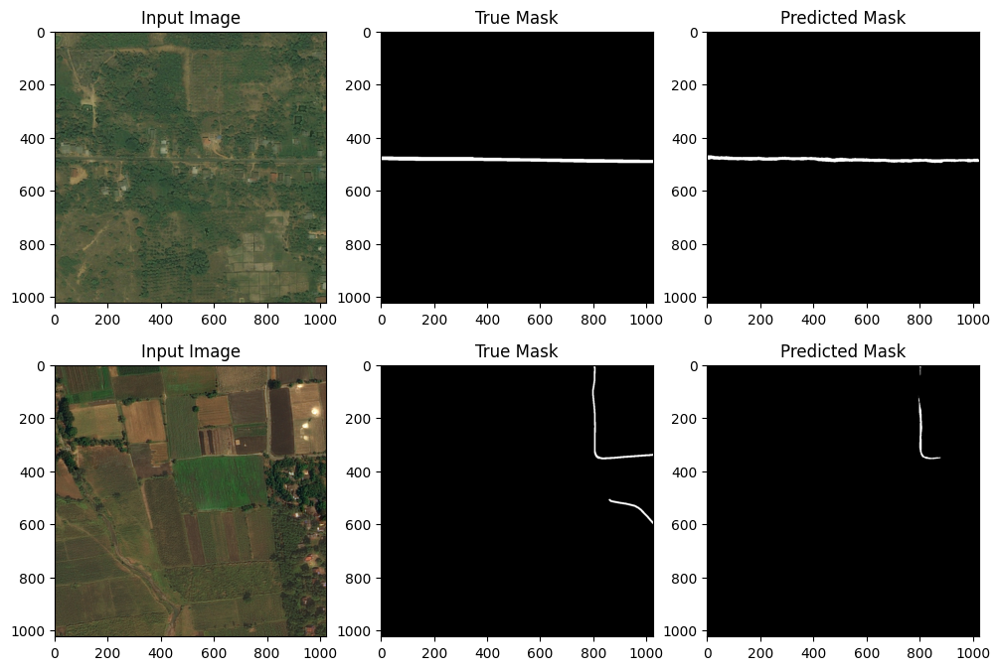

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 467s 178ms/step - f1_score: 0.6907 - iou: 0.5340 - loss: 0.3098 - precision: 0.6977 - recall: 0.7058 - val_f1_score: 0.6377 - val_iou: 0.4801 - val_loss: 0.3630 - val_precision: 0.7662 - val_recall: 0.5711 - learning_rate: 1.0000e-04
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/stepms/step - f1_score: 0.6958 - iou: 0.5398 - loss: 0.3047 - precision: 0.7017 - recall: 0.711


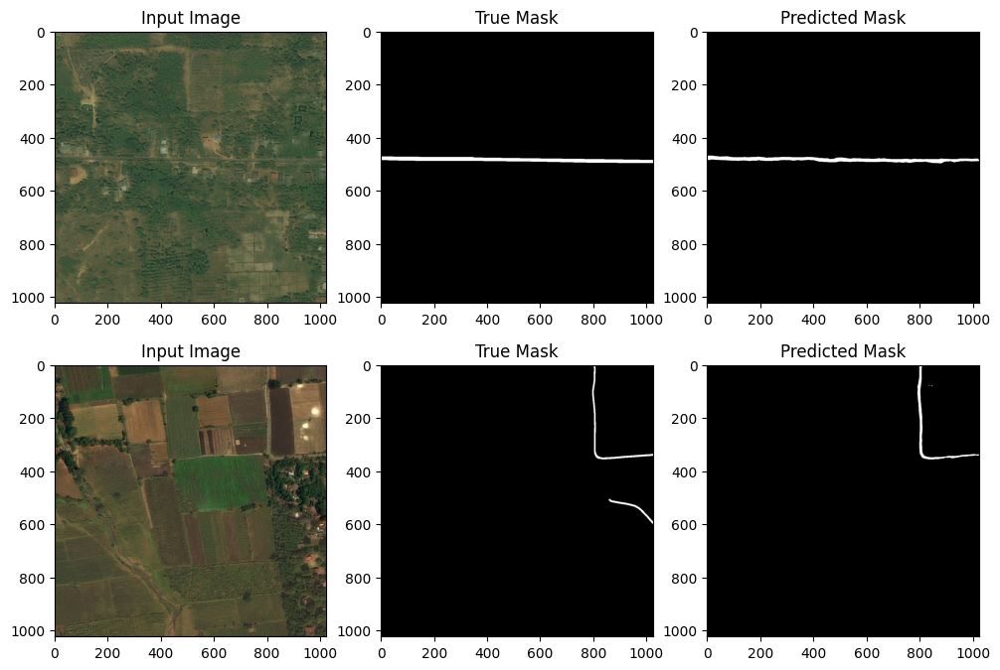

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 460s 176ms/step - f1_score: 0.6958 - iou: 0.5398 - loss: 0.3047 - precision: 0.7017 - recall: 0.7118 - val_f1_score: 0.6594 - val_iou: 0.5041 - val_loss: 0.3409 - val_precision: 0.7596 - val_recall: 0.6075 - learning_rate: 1.0000e-04
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/stepms/step - f1_score: 0.6957 - iou: 0.5396 - loss: 0.3048 - precision: 0.6994 - recall: 0.712


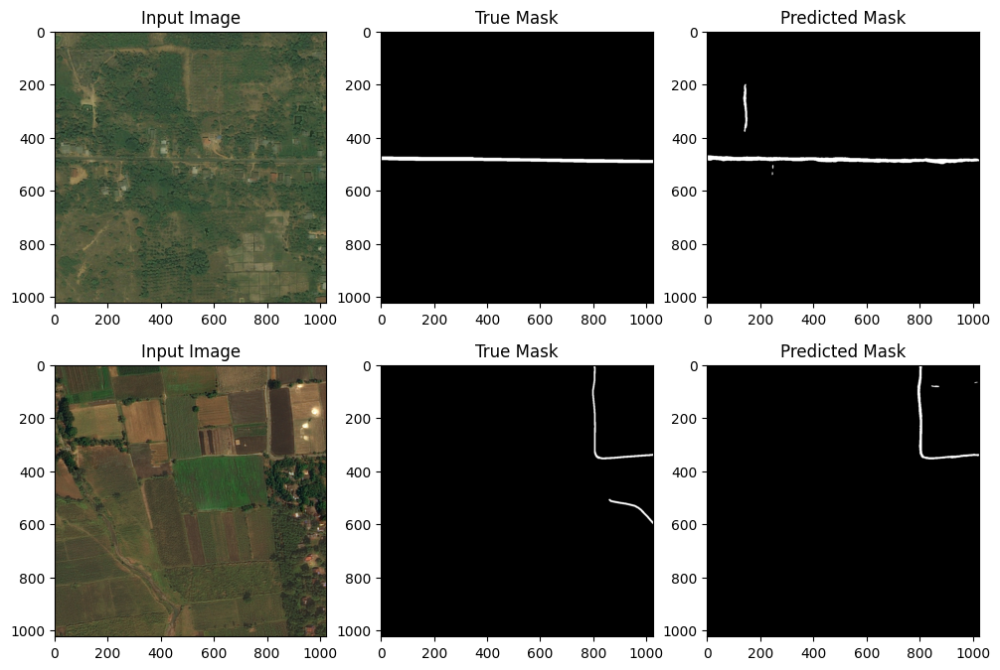

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 465s 178ms/step - f1_score: 0.6957 - iou: 0.5396 - loss: 0.3048 - precision: 0.6994 - recall: 0.7128 - val_f1_score: 0.6911 - val_iou: 0.5365 - val_loss: 0.3093 - val_precision: 0.7087 - val_recall: 0.6948 - learning_rate: 1.0000e-04
Epoch 17/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/stepms/step - f1_score: 0.7041 - iou: 0.5495 - loss: 0.2964 - precision: 0.7104 - recall: 0.718


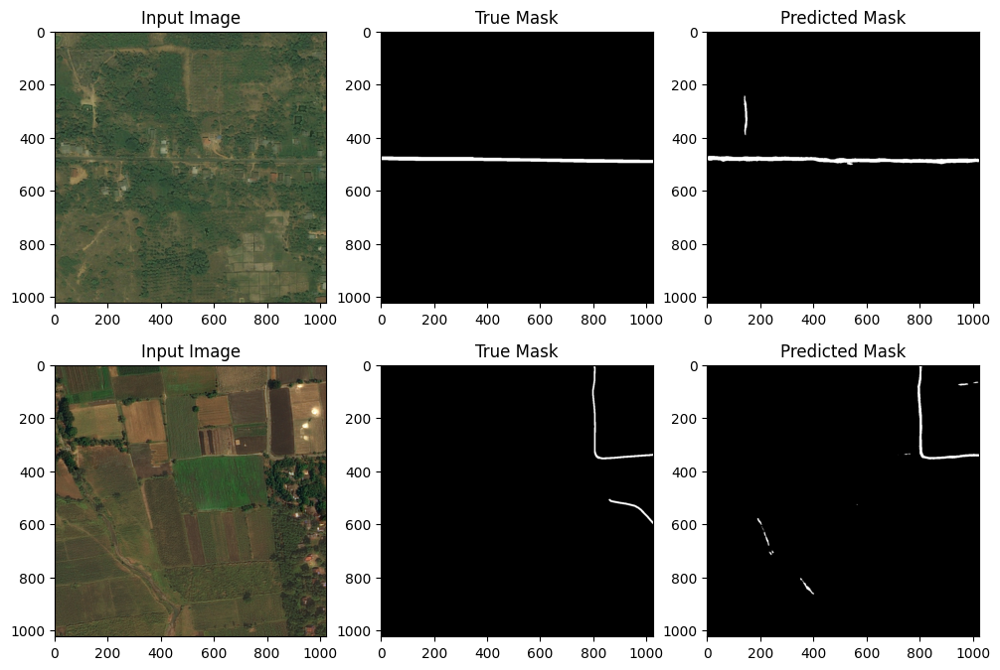

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 458s 175ms/step - f1_score: 0.7041 - iou: 0.5495 - loss: 0.2964 - precision: 0.7104 - recall: 0.7182 - val_f1_score: 0.6594 - val_iou: 0.5031 - val_loss: 0.3411 - val_precision: 0.7644 - val_recall: 0.6060 - learning_rate: 1.0000e-04
Epoch 18/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/stepms/step - f1_score: 0.7050 - iou: 0.5506 - loss: 0.2955 - precision: 0.7096 - recall: 0.719


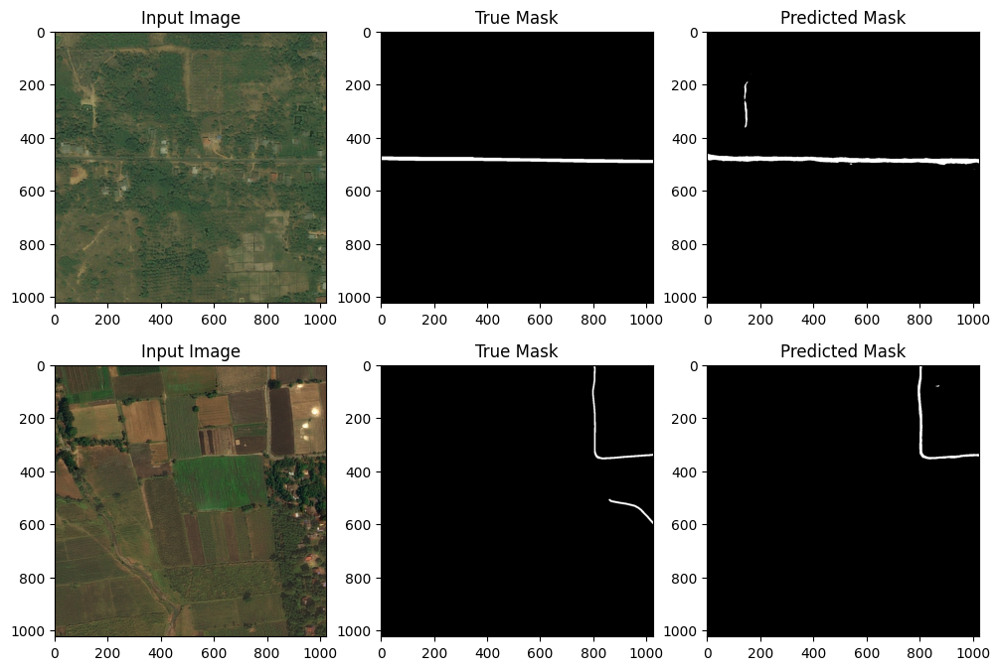

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 493s 188ms/step - f1_score: 0.7050 - iou: 0.5506 - loss: 0.2955 - precision: 0.7096 - recall: 0.7191 - val_f1_score: 0.6889 - val_iou: 0.5351 - val_loss: 0.3115 - val_precision: 0.7205 - val_recall: 0.6840 - learning_rate: 1.0000e-04
Epoch 19/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/stepms/step - f1_score: 0.7061 - iou: 0.5521 - loss: 0.2943 - precision: 0.7115 - recall: 0.720


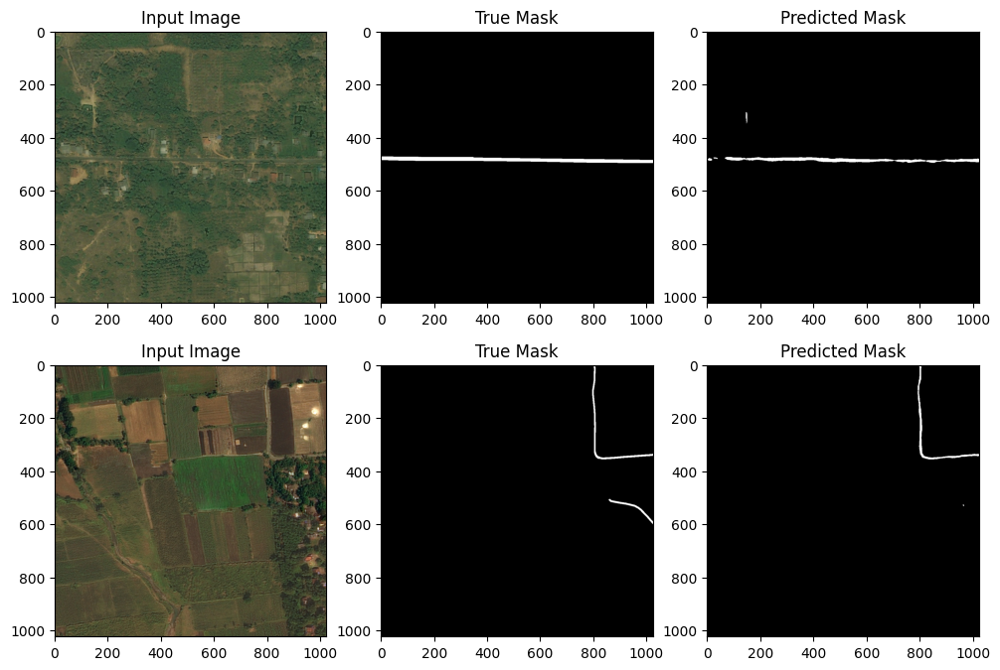

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 498s 190ms/step - f1_score: 0.7061 - iou: 0.5522 - loss: 0.2943 - precision: 0.7115 - recall: 0.7201 - val_f1_score: 0.6872 - val_iou: 0.5336 - val_loss: 0.3132 - val_precision: 0.7436 - val_recall: 0.6607 - learning_rate: 1.0000e-04
Epoch 20/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/stepms/step - f1_score: 0.7108 - iou: 0.5579 - loss: 0.2896 - precision: 0.7159 - recall: 0.725


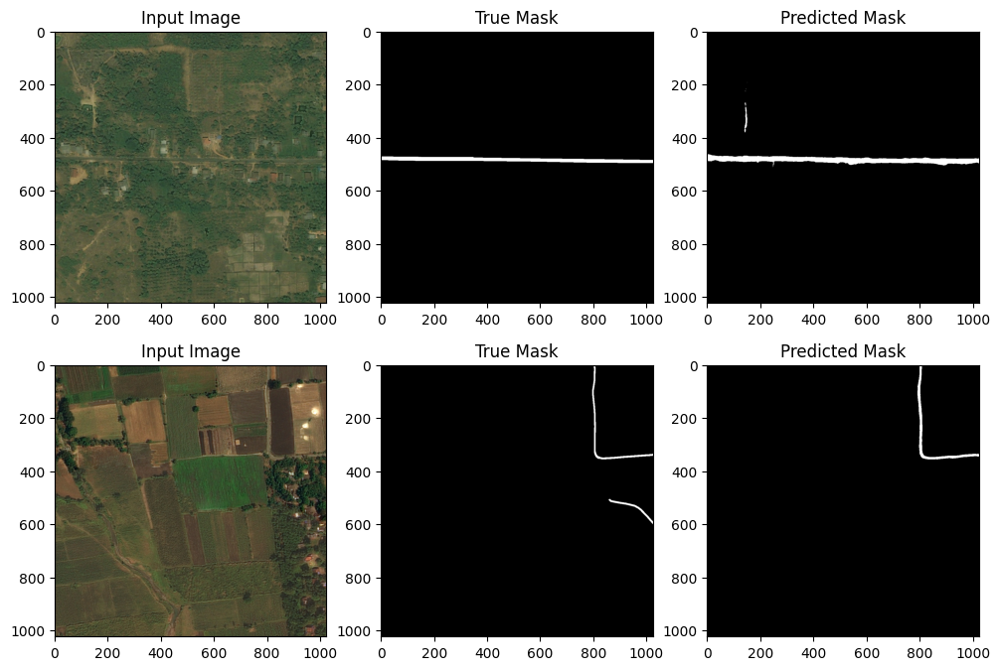

2613/2613 ━━━━━━━━━━━━━━━━━━━━ 494s 189ms/step - f1_score: 0.7108 - iou: 0.5579 - loss: 0.2896 - precision: 0.7159 - recall: 0.7251 - val_f1_score: 0.6912 - val_iou: 0.5372 - val_loss: 0.3091 - val_precision: 0.7290 - val_recall: 0.6797 - learning_rate: 1.0000e-04


In [56]:
with tf.device("/GPU:0"):
    history = model.fit(
        train_generator,
        epochs=20,
        validation_data=val_generator,
        callbacks=[best_model_checkpoint, early_stopping, reduce_lr, csv_logger, ValidationVisualization(val_generator, prediction_dir)]
    )


In [57]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_weight_distribution(model):
    """
    Plots the distribution of weights for each layer in the given model.
    Args:
        model (tf.keras.Model or torch.nn.Module): The trained model whose weights need to be visualized.
    """
    layers = model.layers if hasattr(model, 'layers') else list(model.children())
    
    # Iterate over each layer and extract weights
    for layer in layers:
        if len(layer.get_weights()) > 0:  # Check if the layer has weights
            weights = layer.get_weights()[0]  # Get the weights (excluding biases)
            # Flatten weights and plot the distribution
            flattened_weights = weights.flatten()

            # Plot using seaborn
            plt.figure(figsize=(10, 6))
            sns.histplot(flattened_weights, bins=50, kde=True)
            plt.title(f'Weight Distribution for {layer.name}')
            plt.xlabel('Weight values')
            plt.ylabel('Frequency')
            plt.grid(True)
            plt.show()


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


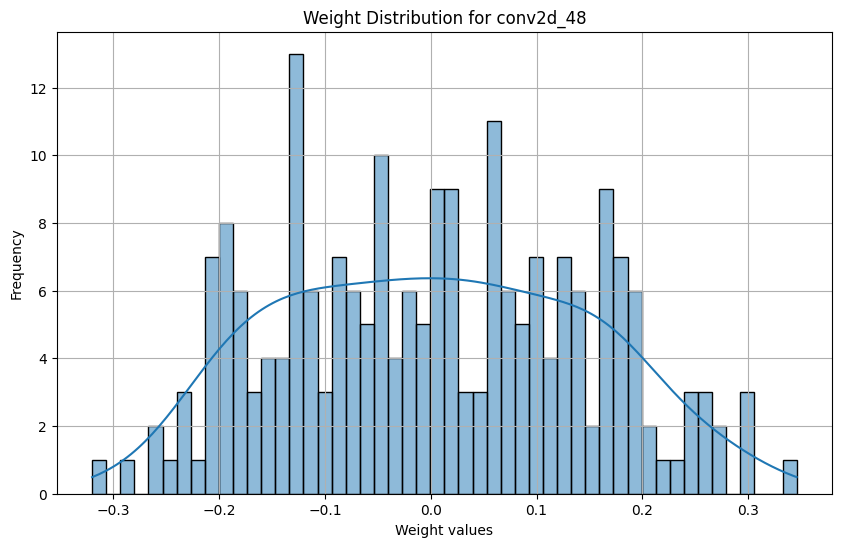

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


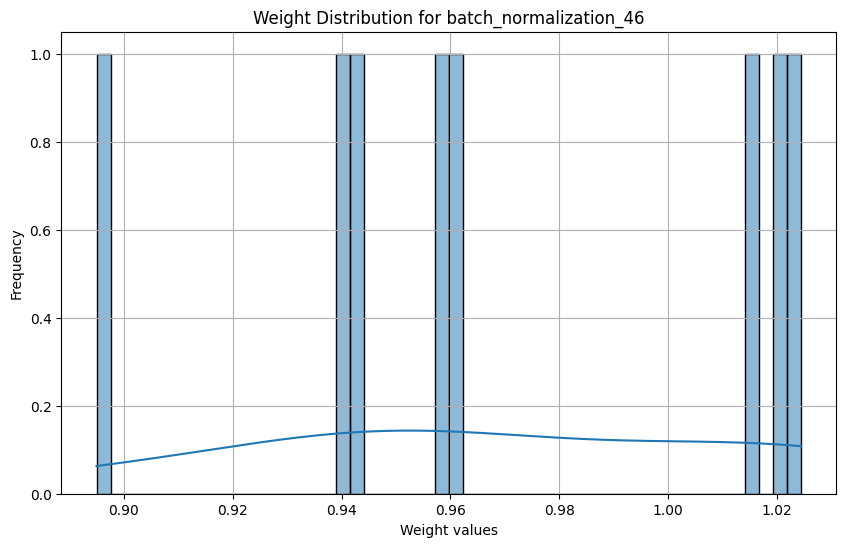

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


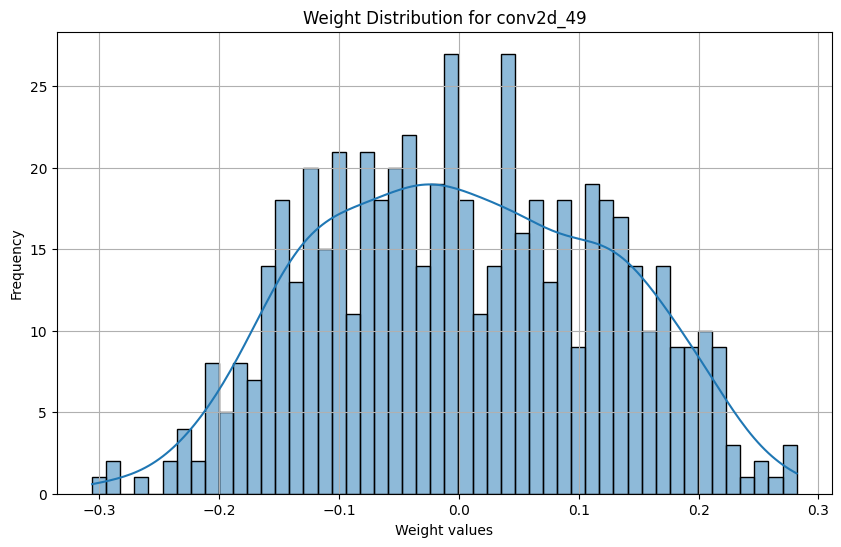

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


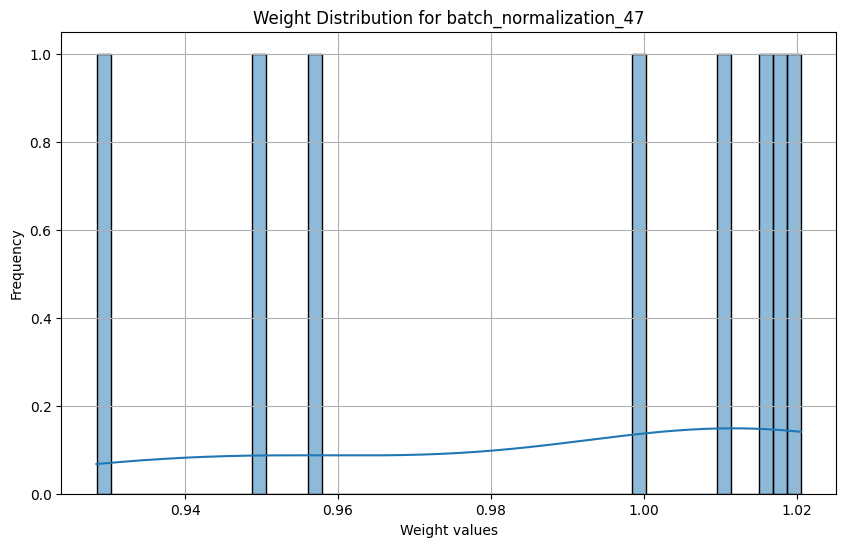

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


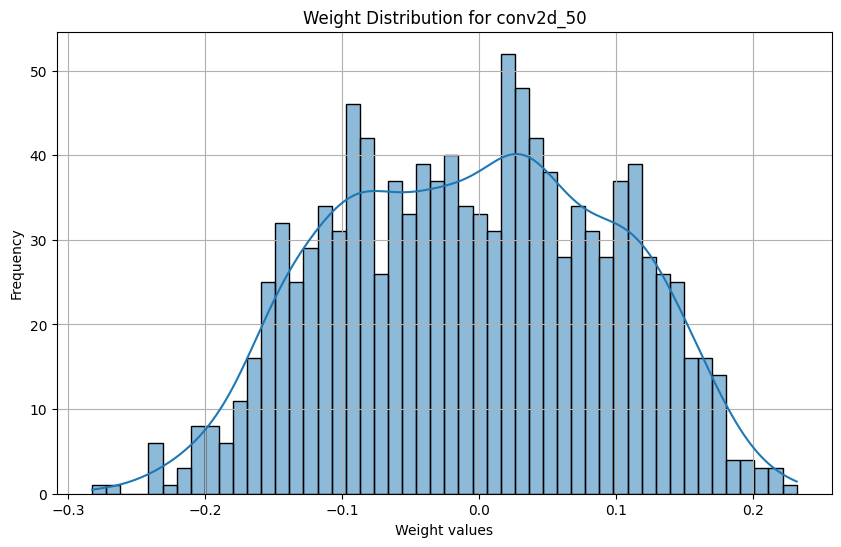

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


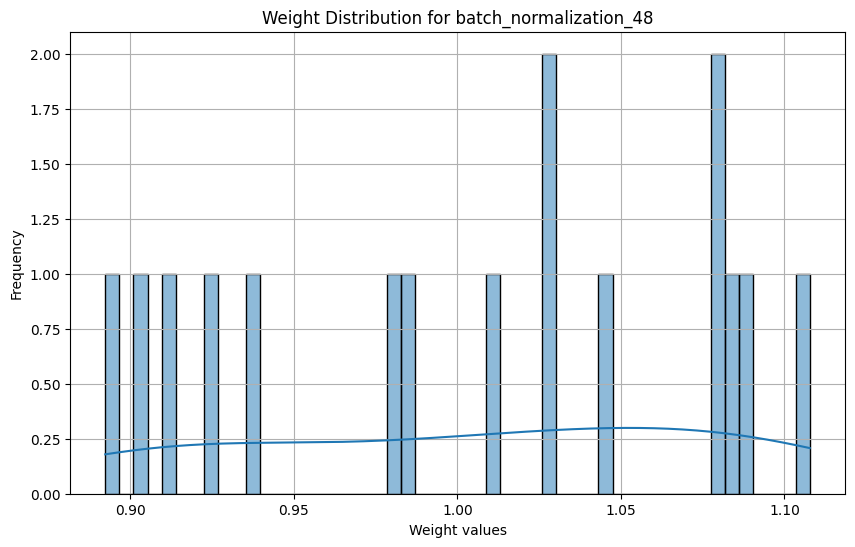

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


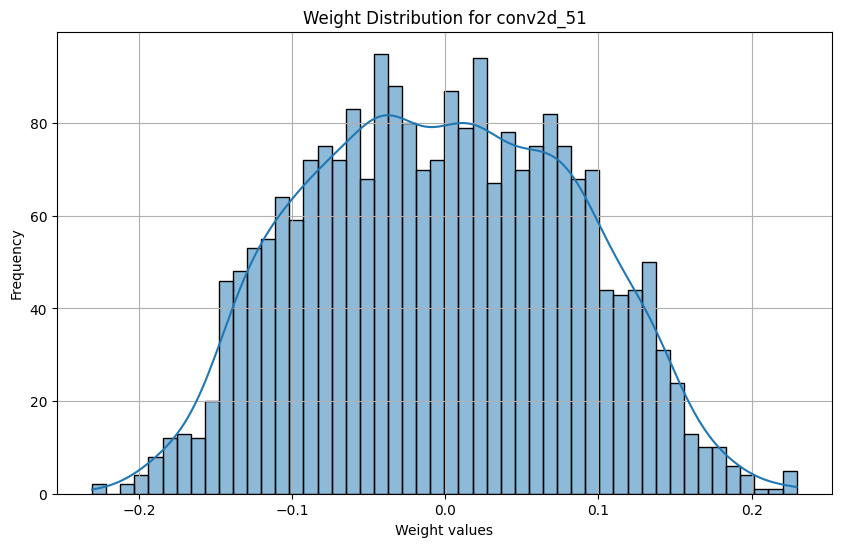

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


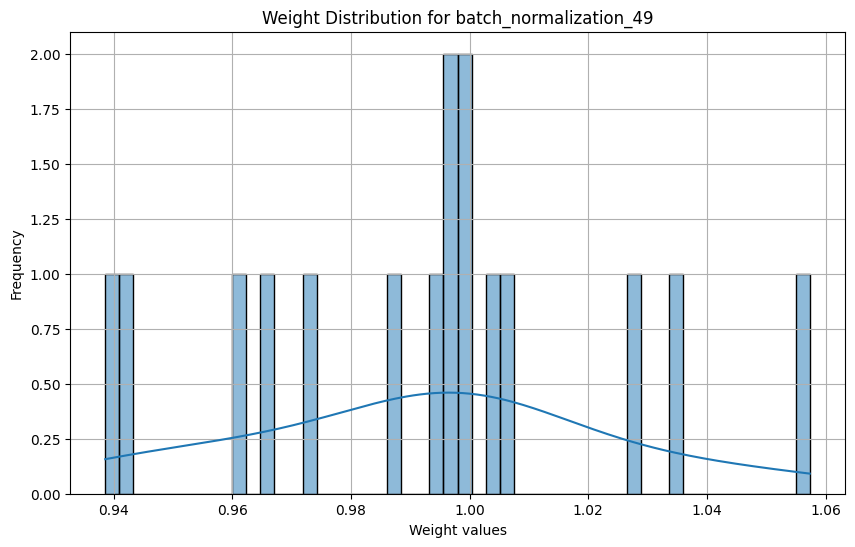

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


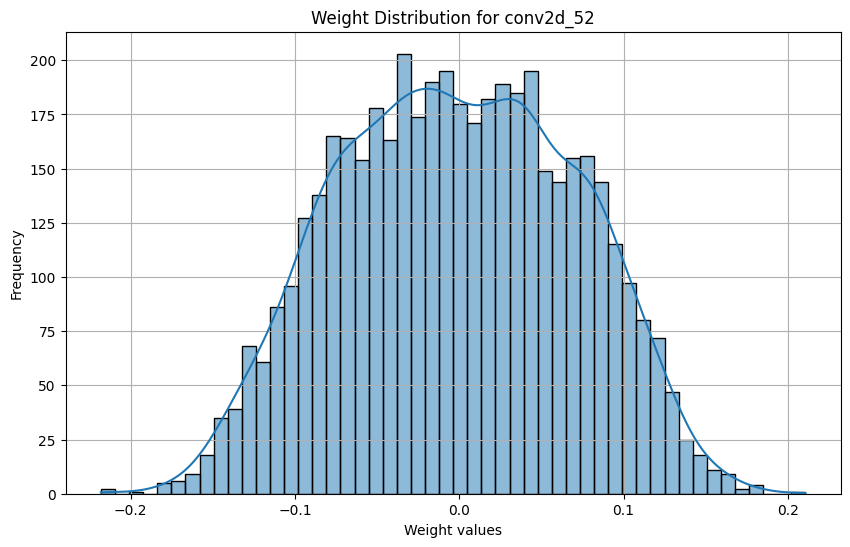

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


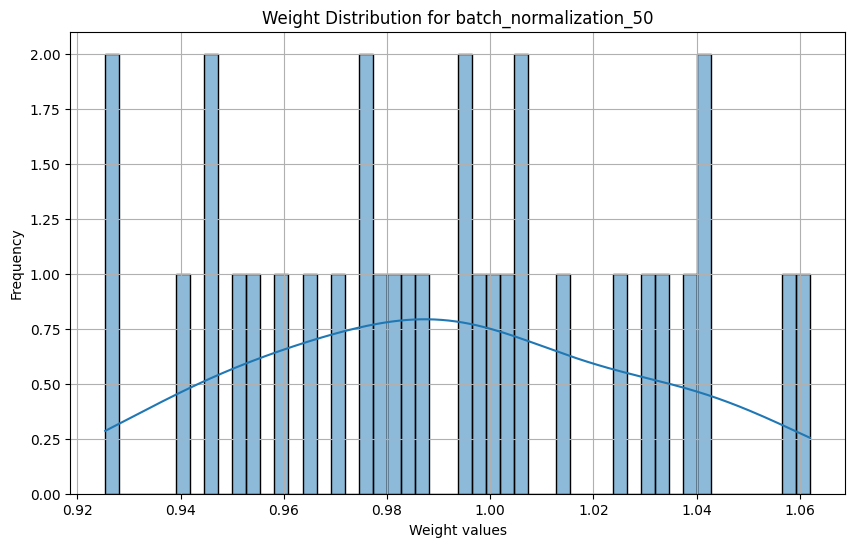

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


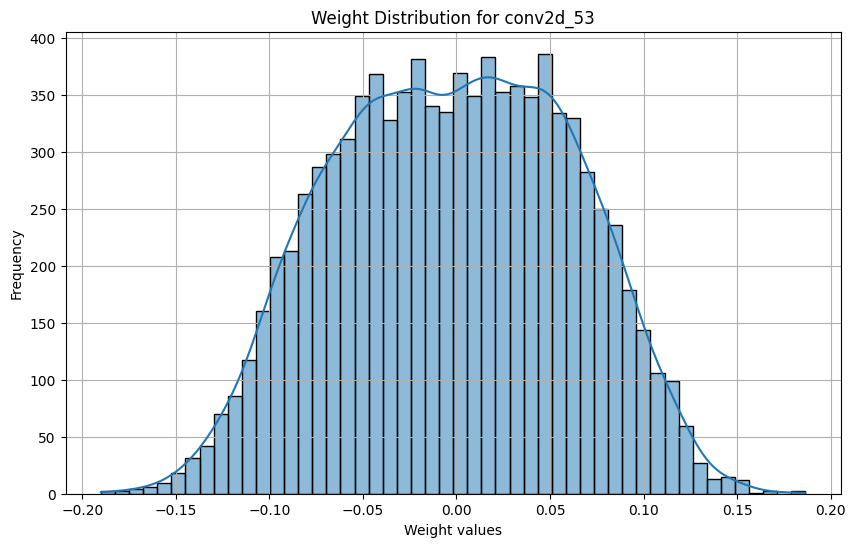

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


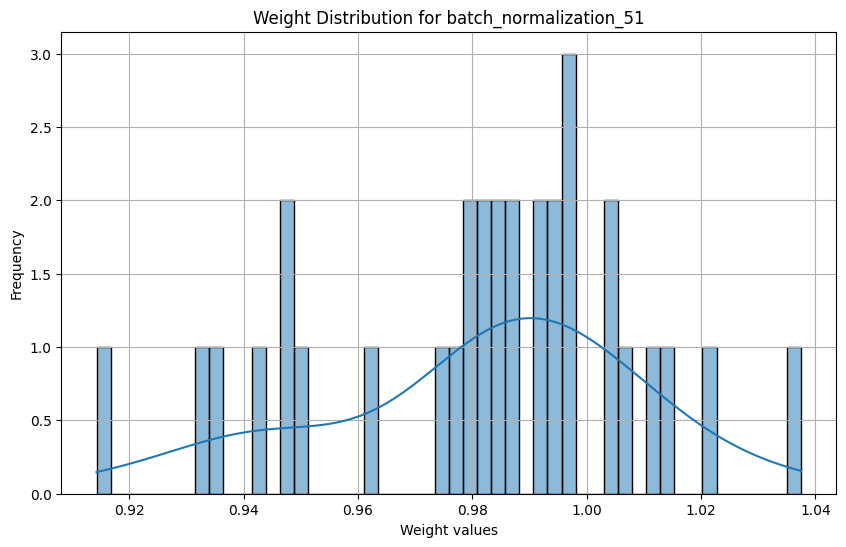

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


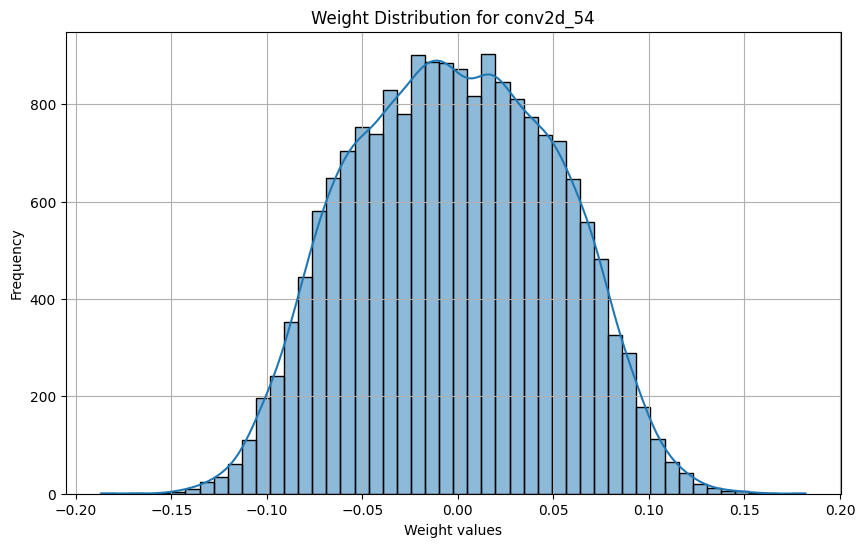

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


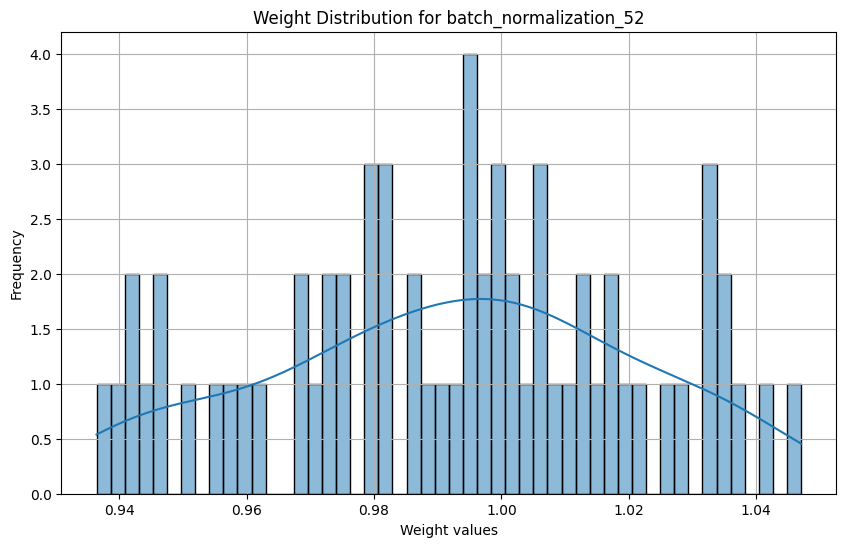

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


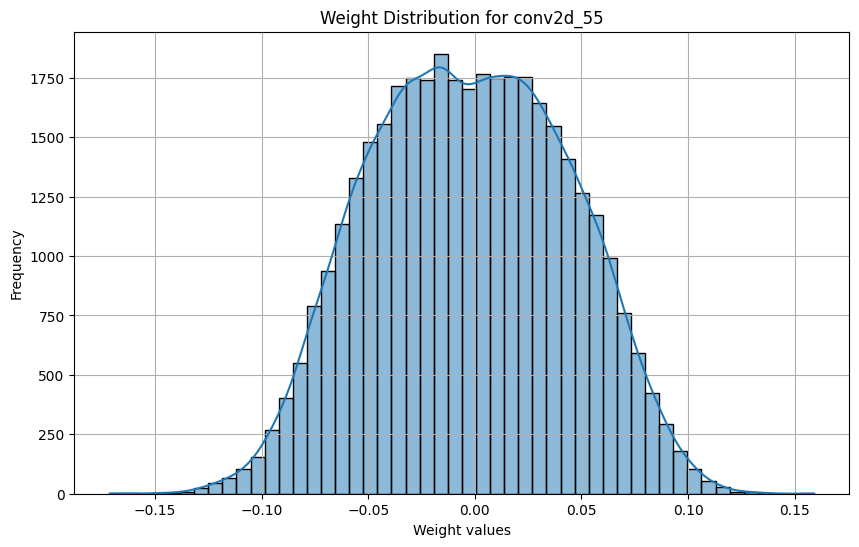

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


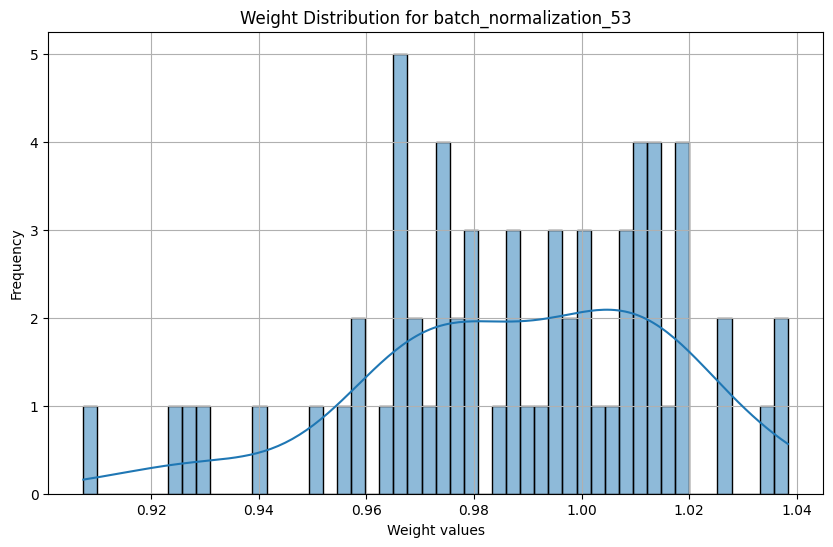

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


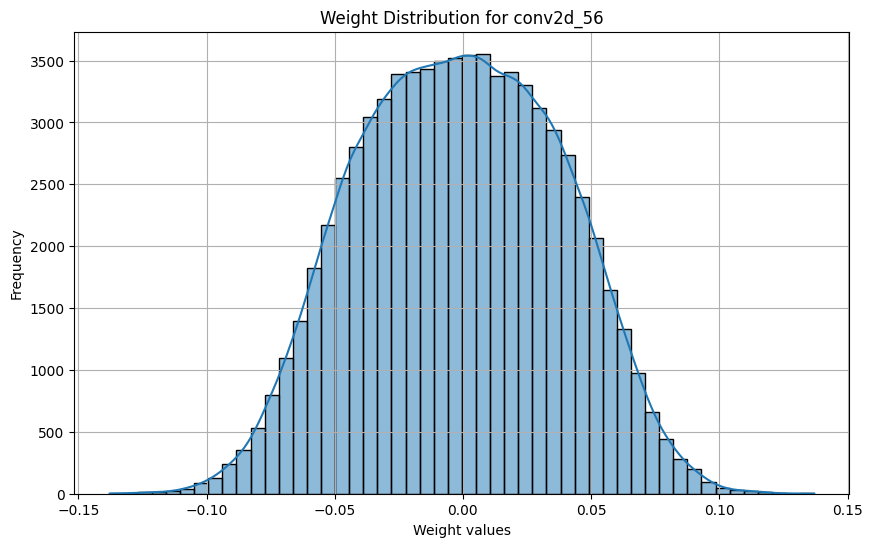

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


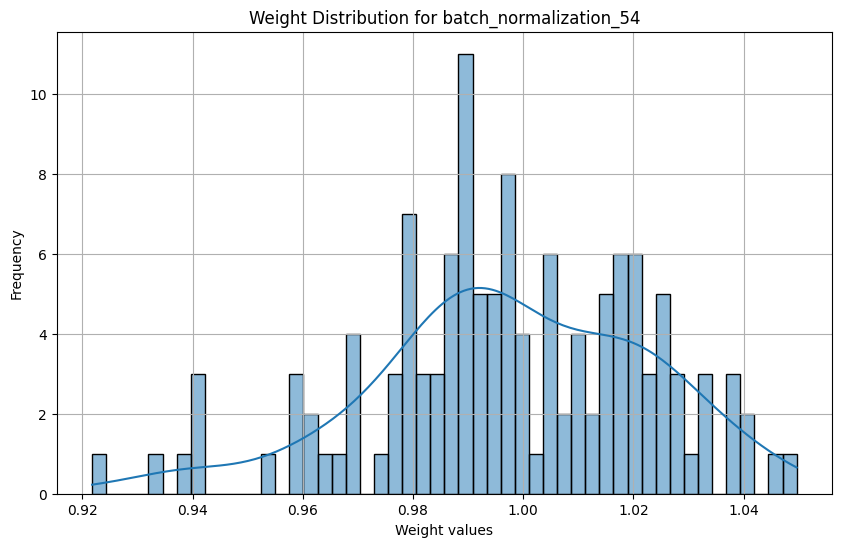

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


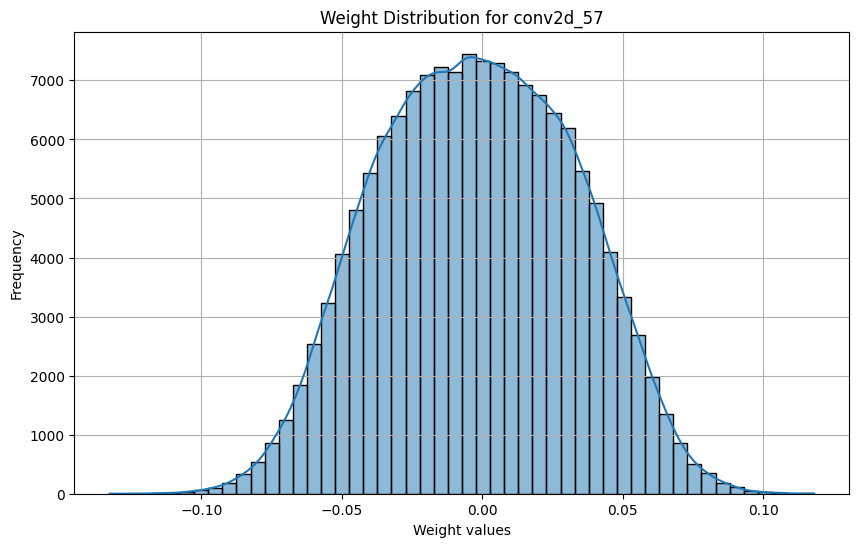

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


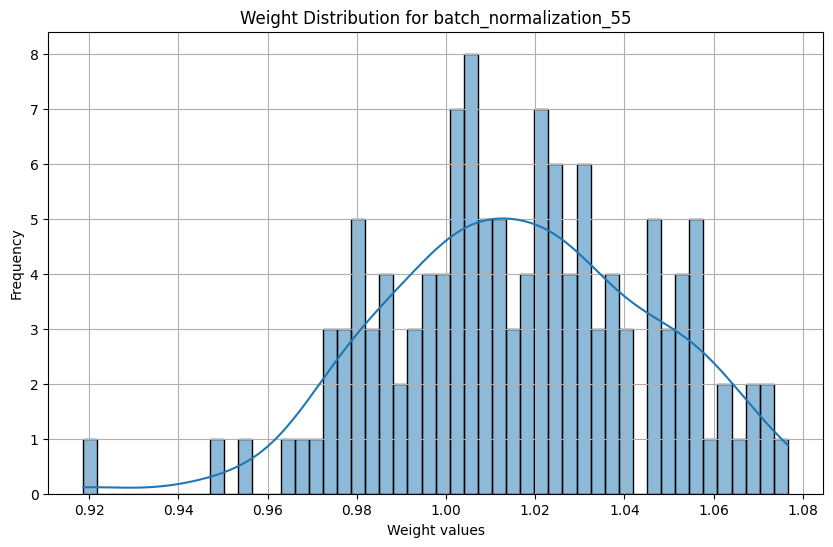

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


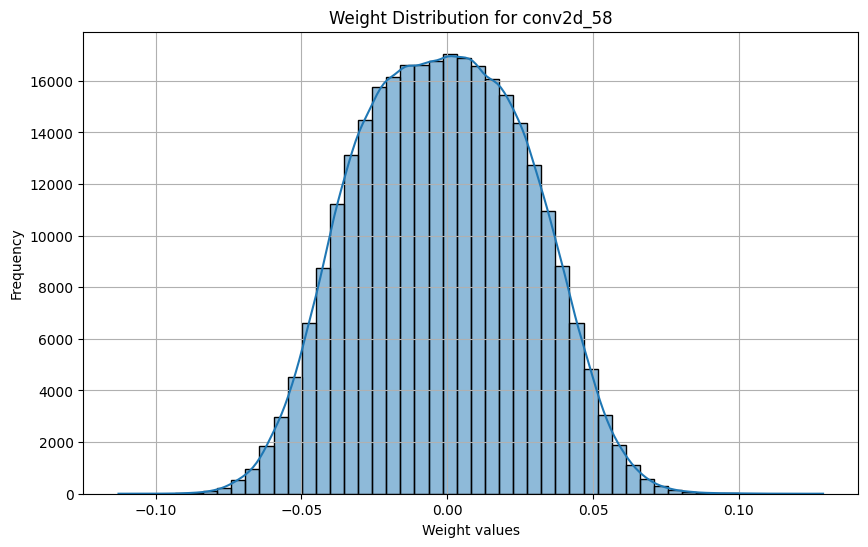

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


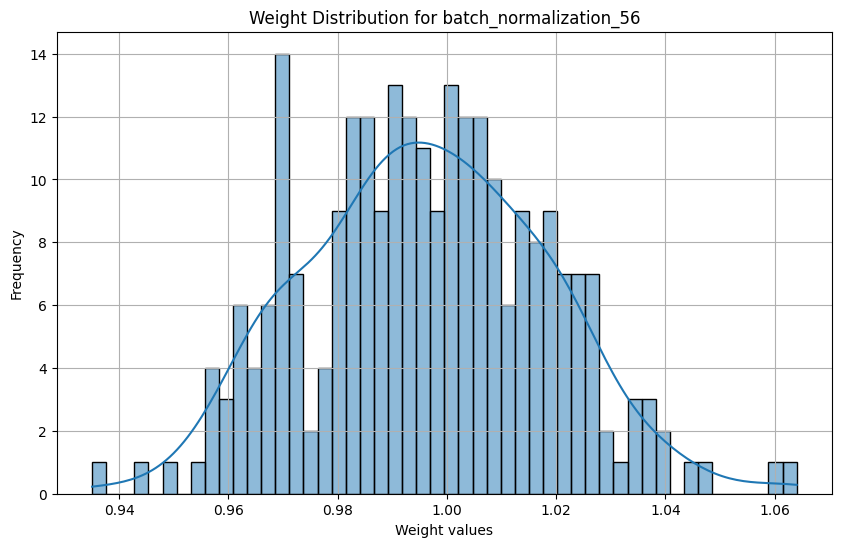

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


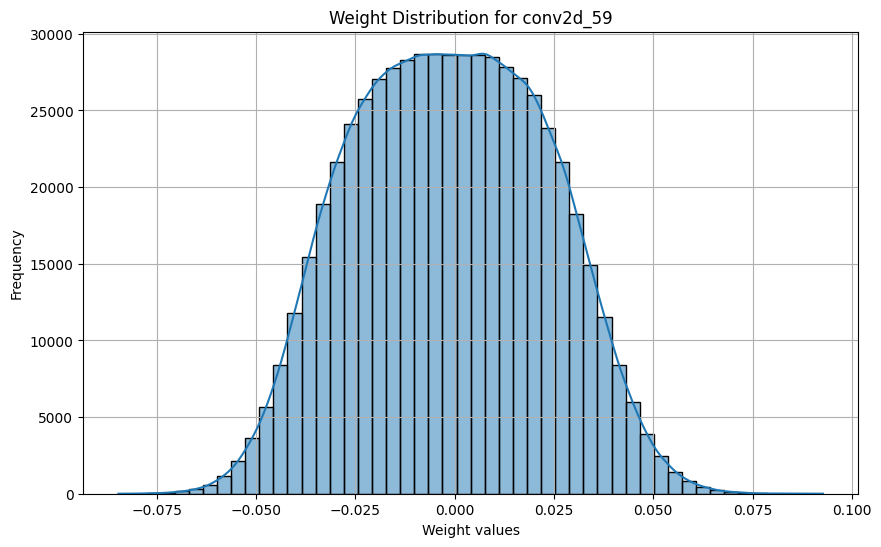

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


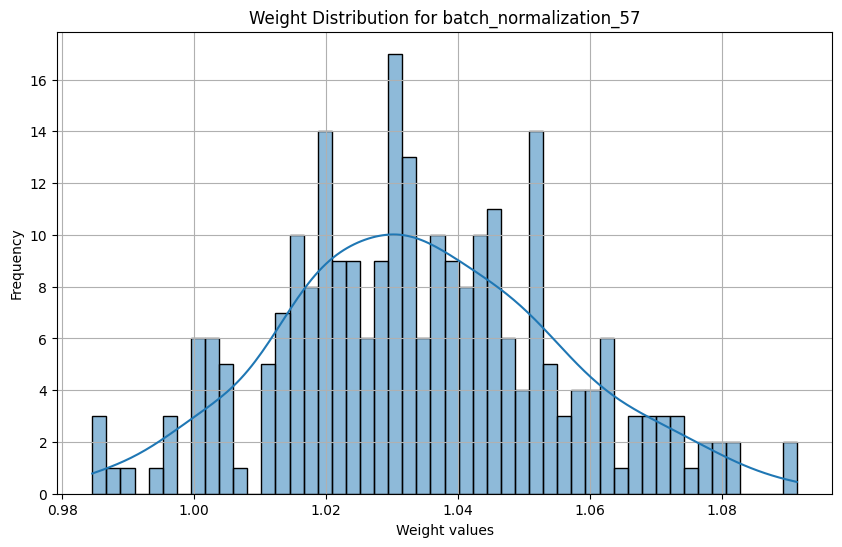

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


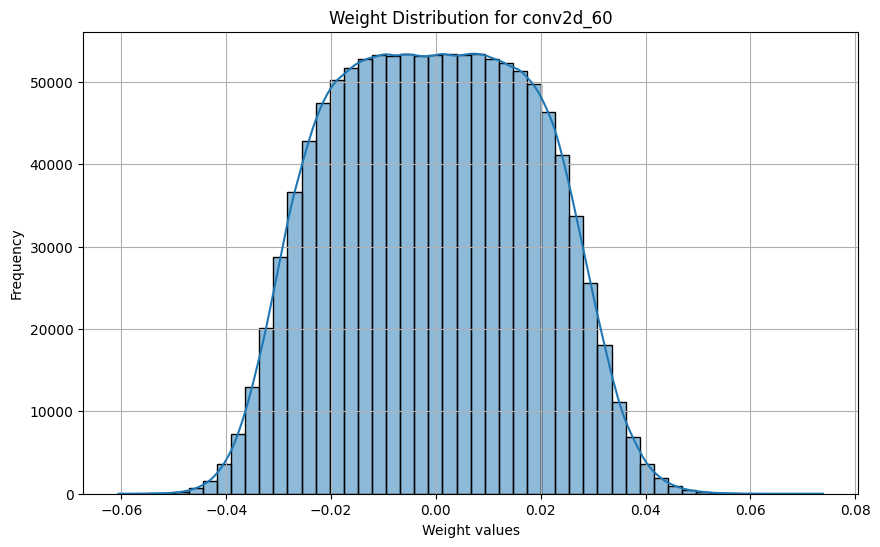

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


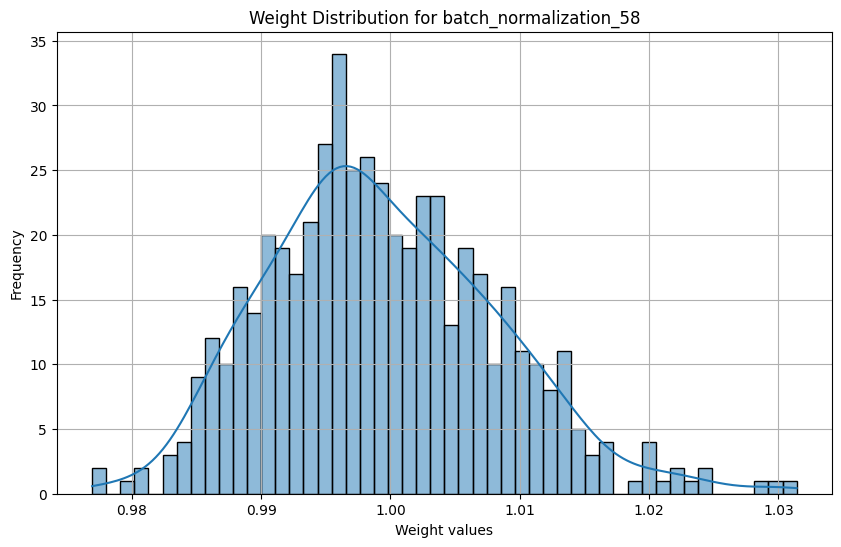

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


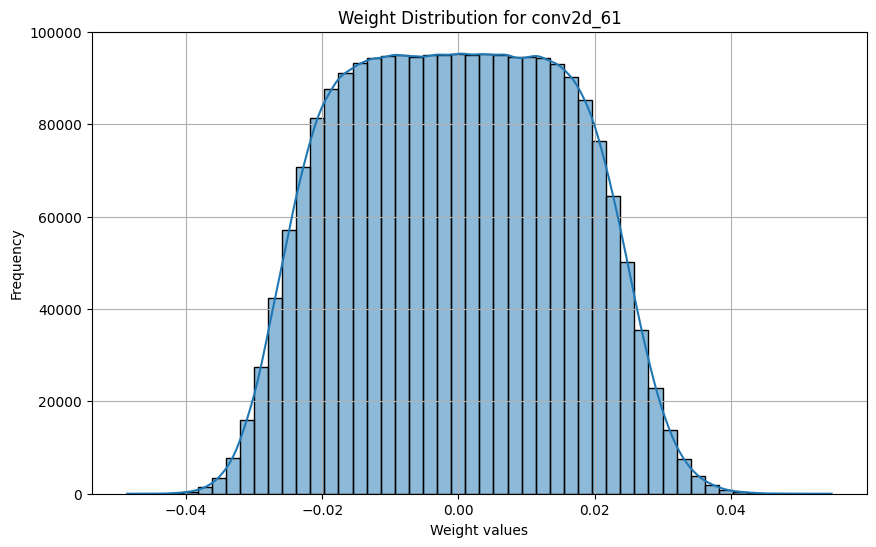

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


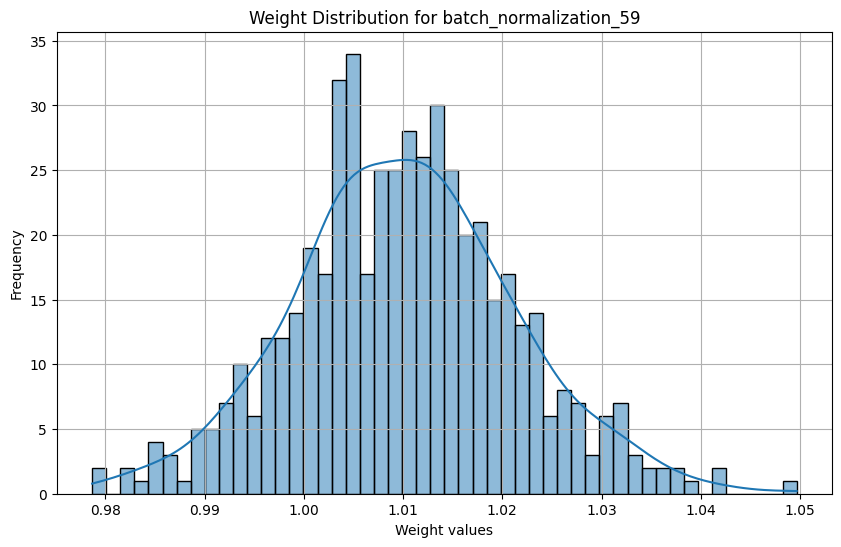

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


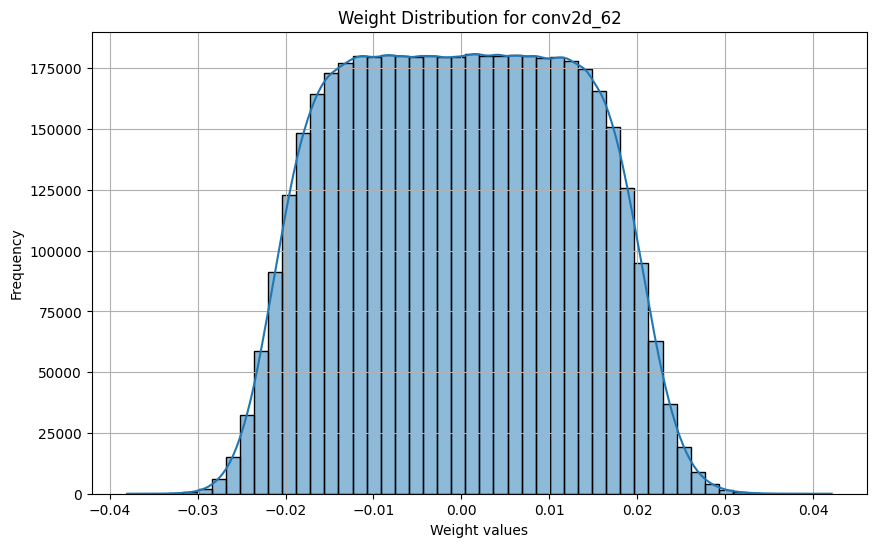

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


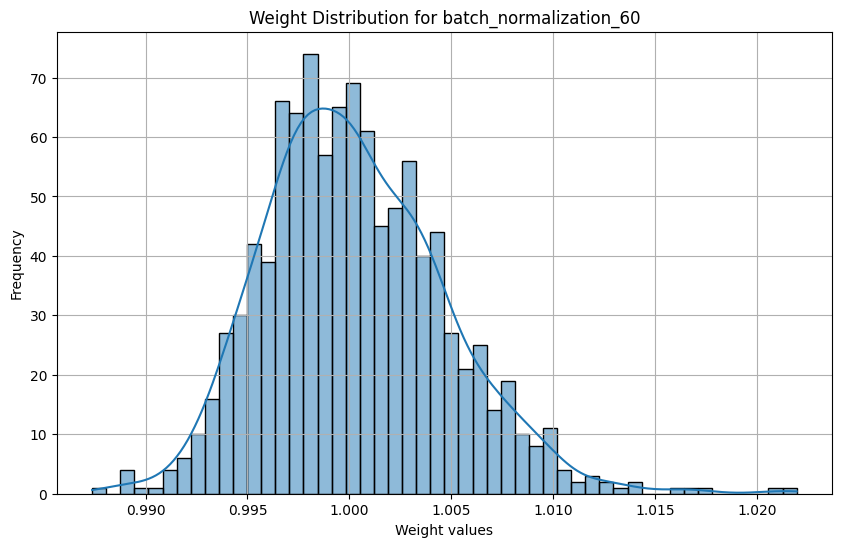

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


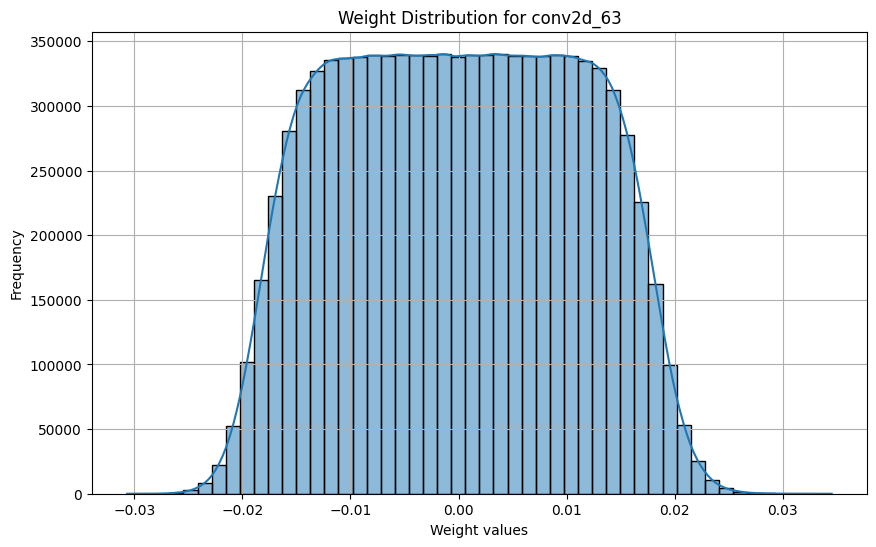

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


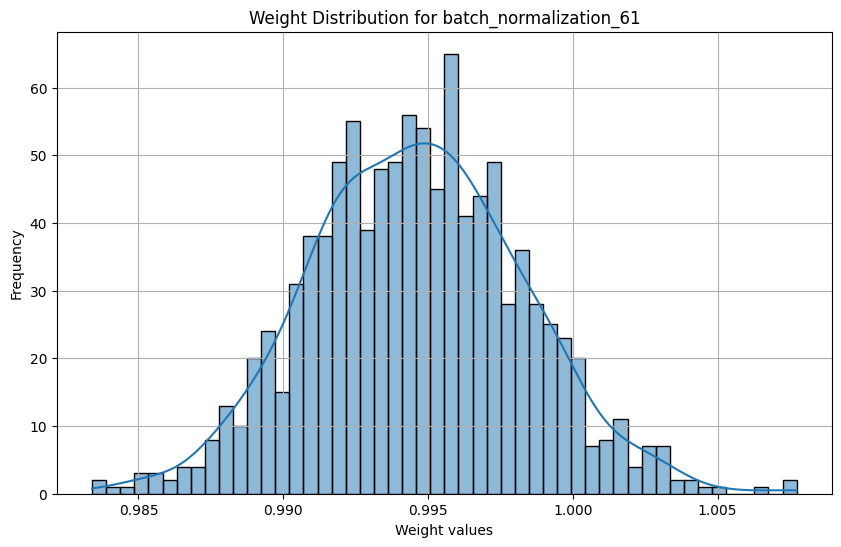

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


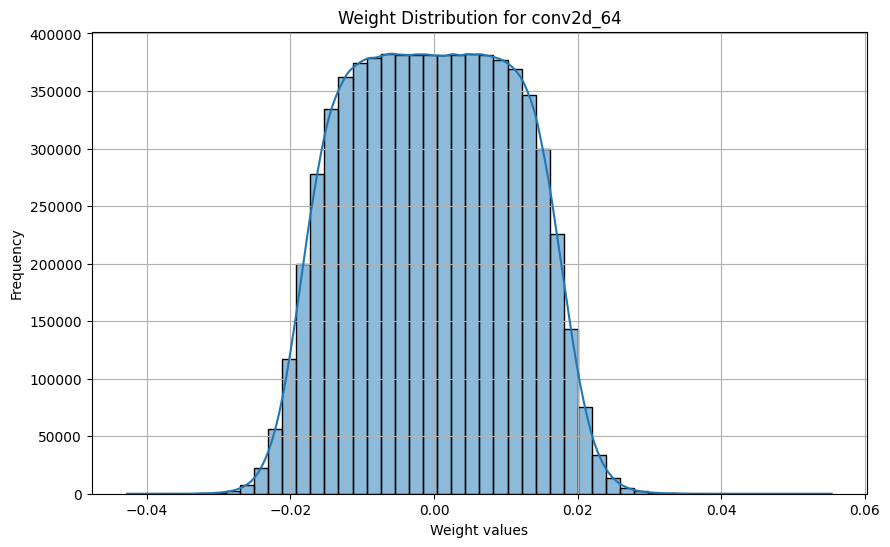

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


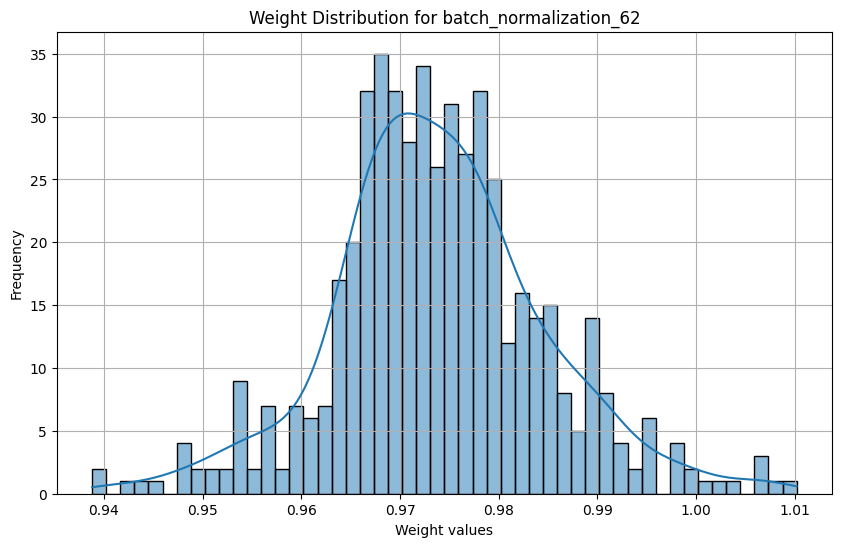

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


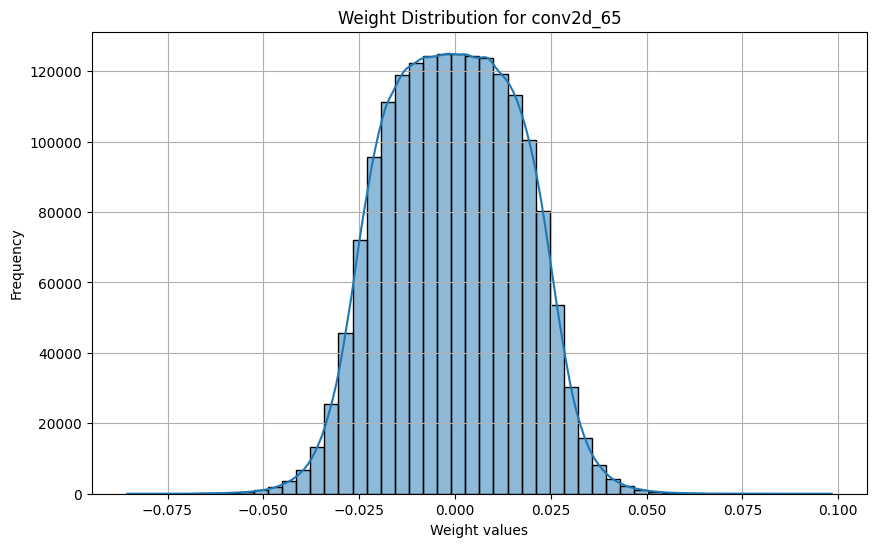

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


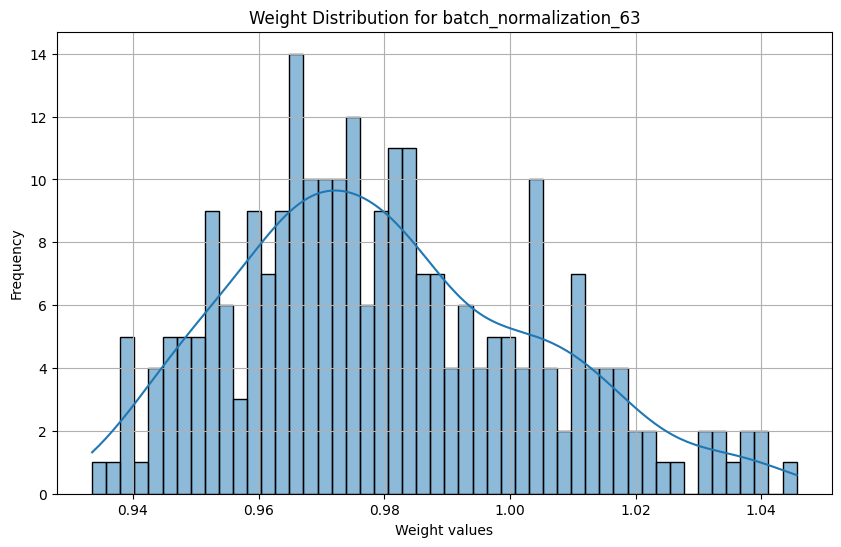

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


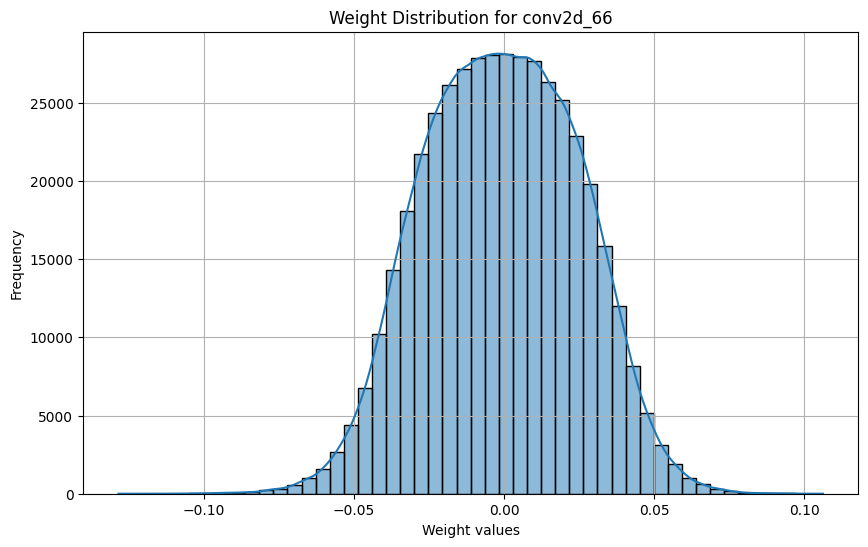

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


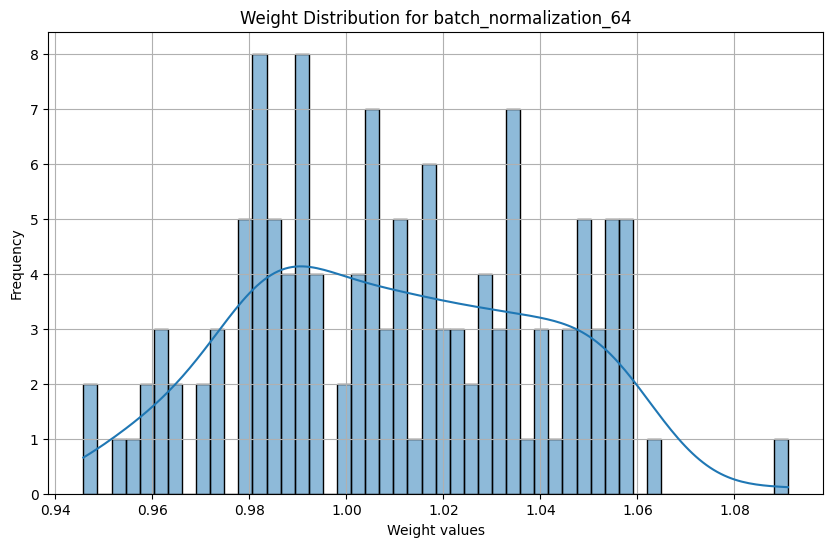

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


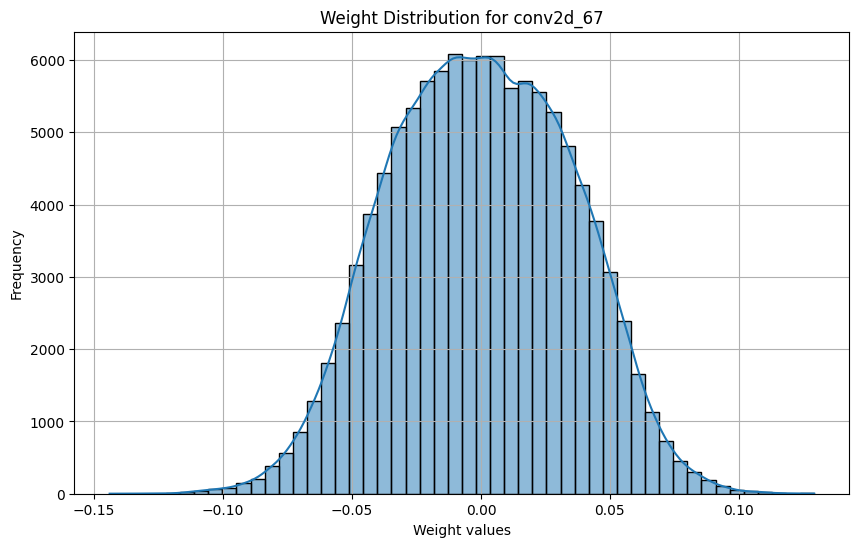

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


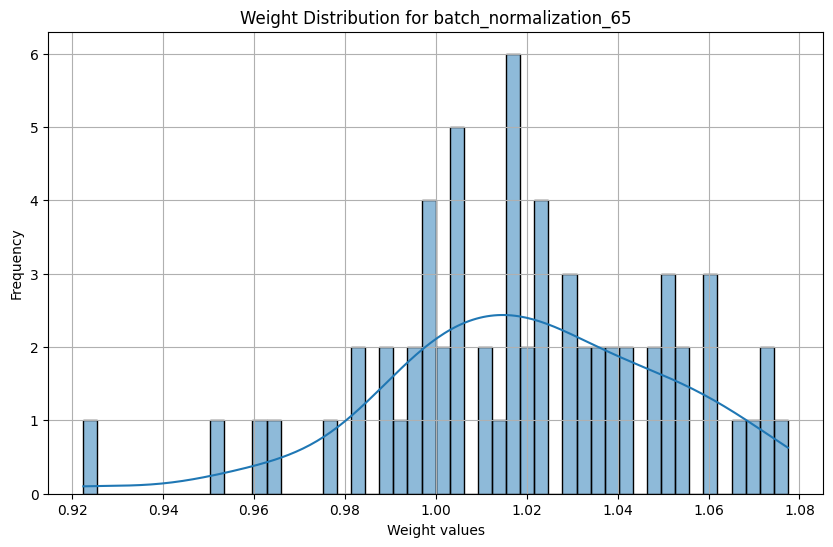

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


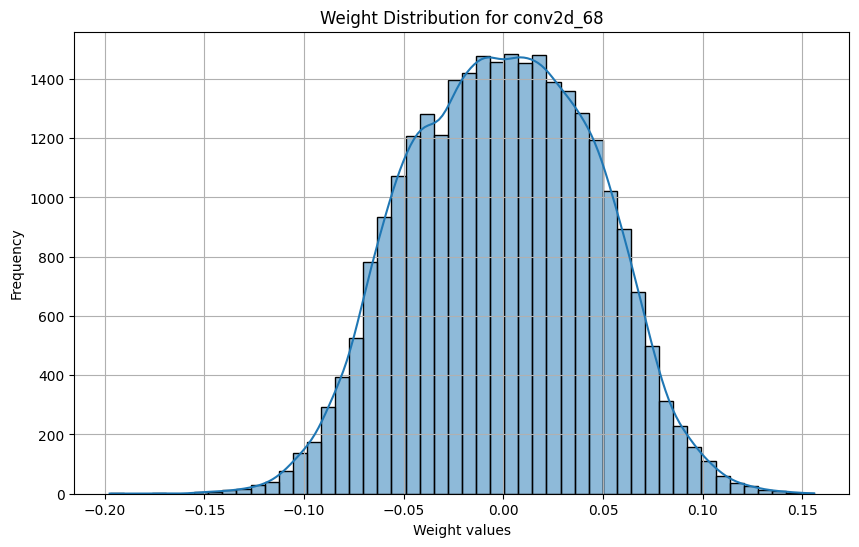

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


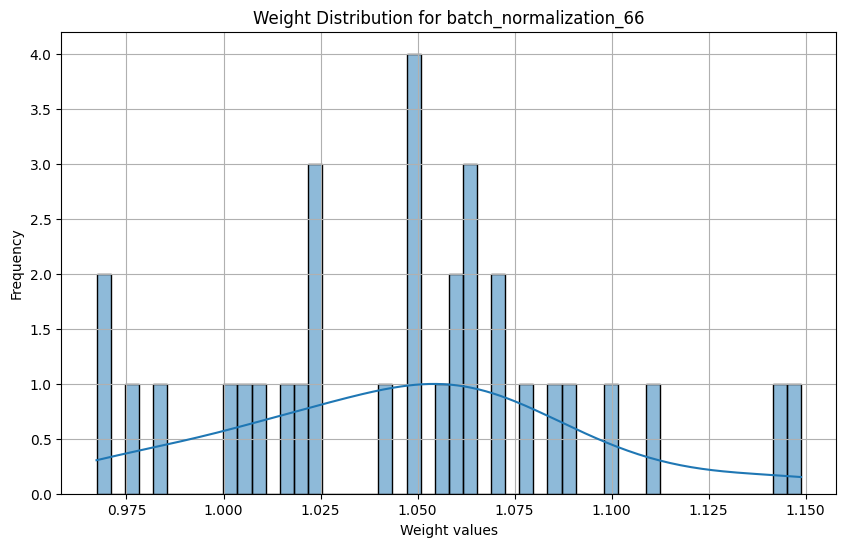

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


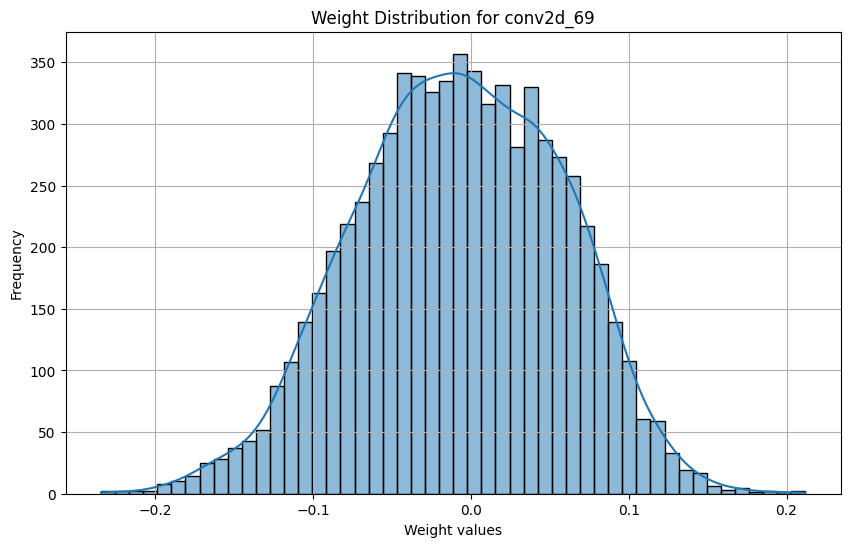

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


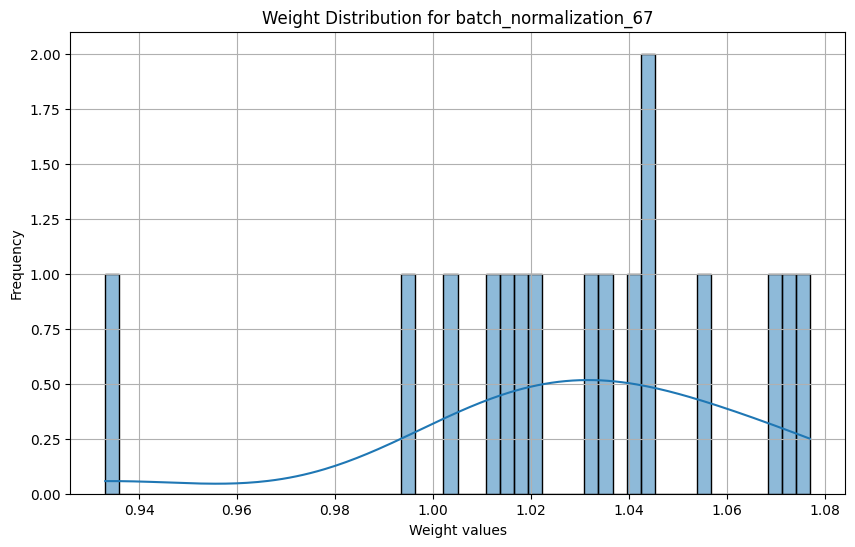

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


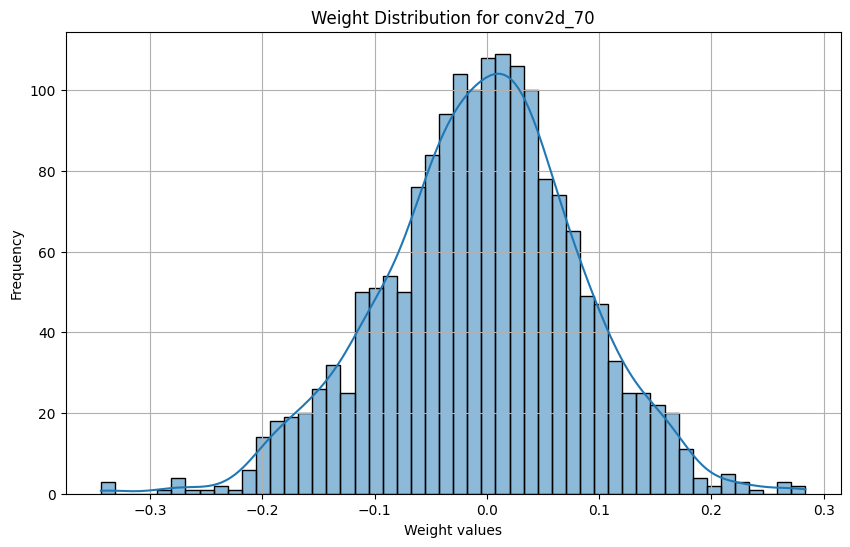

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


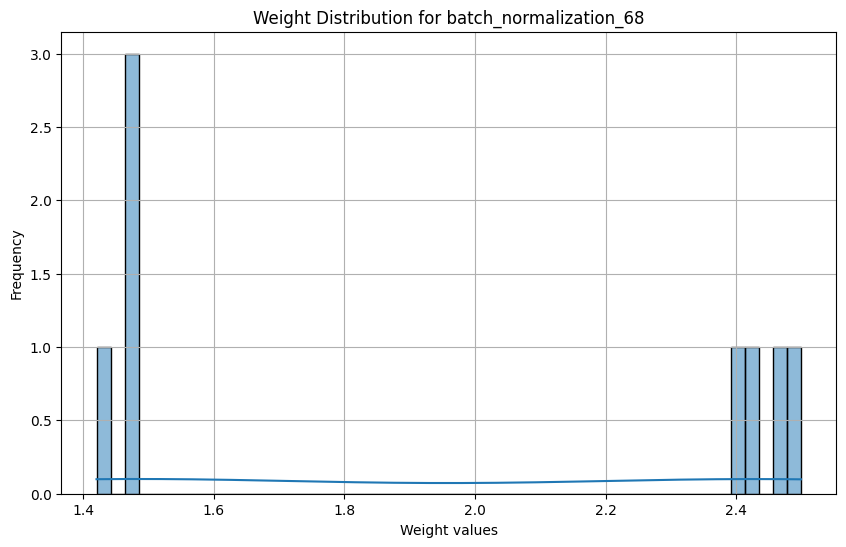

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


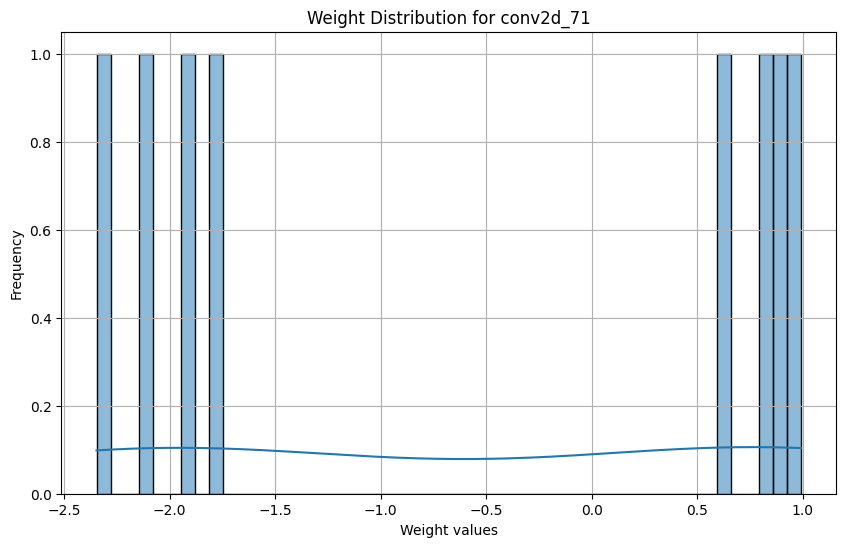

In [58]:
# Assuming you have already trained your U-Net model

# Call this function to plot weight distributions
plot_weight_distribution(model)
